# Business Problem Overview

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.
For many incumbent operators, retaining high profitable customers is the number one business goal.
To reduce customer churn, telecom companies need to predict which customers are at high risk of churn.
In this model, we analysed customer-level data of a leading telecom firm, built predictive models to identify customers at high risk of churn and identified the main indicators of churn.

In [295]:
# Importing the required libraries

import pandas as pd
import numpy as np
import seaborn  as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_rows', 300)
pd.set_option('display.max_columns', 300)

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
import statsmodels.api as sm
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.ensemble import AdaBoostClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Reading and understanding the dataset

In [296]:
#loading the data into the dataset
data_telecom = pd.read_csv("telecom_churn_data.csv")

In [297]:
#Checking the head of the data
data_telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [298]:
#Checking the tail of the data
data_telecom.tail()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
99994,7001548952,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,18.471,69.161,57.530,29.950,5.40,3.36,5.91,0.00,15.19,54.46,52.79,27.14,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,5.40,3.36,5.91,0.00,12.78,54.46,49.58,24.78,0.00,0.00,0.00,2.25,0.00,0.0,3.21,0.11,18.18,57.83,55.49,27.03,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,2.41,3.01,3.21,0.11,0.00,0.0,0.0,0.0,20.59,60.84,58.71,27.14,27.68,20.78,40.94,22.06,47.96,46.93,76.08,82.89,17.45,5.16,43.79,49.46,93.09,72.88,160.83,154.43,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00

In [299]:
#Checking the info of the data
data_telecom.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
 #    Column                    Dtype  
---   ------                    -----  
 0    mobile_number             int64  
 1    circle_id                 int64  
 2    loc_og_t2o_mou            float64
 3    std_og_t2o_mou            float64
 4    loc_ic_t2o_mou            float64
 5    last_date_of_month_6      object 
 6    last_date_of_month_7      object 
 7    last_date_of_month_8      object 
 8    last_date_of_month_9      object 
 9    arpu_6                    float64
 10   arpu_7                    float64
 11   arpu_8                    float64
 12   arpu_9                    float64
 13   onnet_mou_6               float64
 14   onnet_mou_7               float64
 15   onnet_mou_8               float64
 16   onnet_mou_9               float64
 17   offnet_mou_6              float64
 18   offnet_mou_7              float64
 19   offnet_mou_8              float64
 20   offn

In [300]:
#Checking the statistics of the data
data_telecom.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621

In [301]:
#Checking the shape of the data
data_telecom.shape

(99999, 226)

Total number of columns present in the dataset is 235 and the total number of rows in 99999

In [302]:
#Checking for all the datatypes of the dataset
data_telecom.dtypes

mobile_number                 int64
circle_id                     int64
loc_og_t2o_mou              float64
std_og_t2o_mou              float64
loc_ic_t2o_mou              float64
last_date_of_month_6         object
last_date_of_month_7         object
last_date_of_month_8         object
last_date_of_month_9         object
arpu_6                      float64
arpu_7                      float64
arpu_8                      float64
arpu_9                      float64
onnet_mou_6                 float64
onnet_mou_7                 float64
onnet_mou_8                 float64
onnet_mou_9                 float64
offnet_mou_6                float64
offnet_mou_7                float64
offnet_mou_8                float64
offnet_mou_9                float64
roam_ic_mou_6               float64
roam_ic_mou_7               float64
roam_ic_mou_8               float64
roam_ic_mou_9               float64
roam_og_mou_6               float64
roam_og_mou_7               float64
roam_og_mou_8               

As it can be seen that the dataset consists of float64, int64 and object datatypes only

In [303]:
#Checking the dataset for the null values present in it in the form of percentage
100 * data_telecom.isnull().sum()/ len(data_telecom)

mobile_number                0.000000
circle_id                    0.000000
loc_og_t2o_mou               1.018010
std_og_t2o_mou               1.018010
loc_ic_t2o_mou               1.018010
last_date_of_month_6         0.000000
last_date_of_month_7         0.601006
last_date_of_month_8         1.100011
last_date_of_month_9         1.659017
arpu_6                       0.000000
arpu_7                       0.000000
arpu_8                       0.000000
arpu_9                       0.000000
onnet_mou_6                  3.937039
onnet_mou_7                  3.859039
onnet_mou_8                  5.378054
onnet_mou_9                  7.745077
offnet_mou_6                 3.937039
offnet_mou_7                 3.859039
offnet_mou_8                 5.378054
offnet_mou_9                 7.745077
roam_ic_mou_6                3.937039
roam_ic_mou_7                3.859039
roam_ic_mou_8                5.378054
roam_ic_mou_9                7.745077
roam_og_mou_6                3.937039
roam_og_mou_

# Data Preperation

## Handling of missing values

In [304]:
#Checking all the columns which are of object datatype
data_telecom.select_dtypes(include="object")

,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9
0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/21/2014,7/16/2014,8/8/2014,9/28/2014,6/21/2014,7/16/2014,8/8/2014,NaN
1,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/29/2014,7/31/2014,8/28/2014,9/30/2014,NaN,7/25/2014,8/10/2014,NaN
2,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/17/2014,7/24/2014,8/14/2014,9/29/2014,NaN,NaN,NaN,9/17/2014
3,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/28/2014,7/31/2014,8/31/2014,9/30/2014,NaN,NaN,NaN,NaN
4,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/26/2014,7/28/2014,8/9/2014,9/28/2014,6/4/2014,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
99994,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/3/2014,7/20/2014,8/26/2014,9/25/2014,NaN,NaN,NaN,NaN
99995,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/17/2014,7/17/2014,8/24/2014,9/26/2014,NaN,NaN,NaN,NaN
99996,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/13/2014,7/26/2014,NaN,9/2/2014,6/13/2014,NaN,NaN,NaN
99997,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/17/2014,7/19/2014,8/20/2014,9/17/2014,6/17/2014,7/19/2014,8/20/2014,9/17/2014


In [305]:
#preparing the data for data imputation. making some variables for further work on the data
data_telecom["loc_og_t2o_mou"] = 0
data_telecom["std_og_t2o_mou"] = 0
data_telecom["loc_ic_t2o_mou"] = 0

# For the last dat of each months
data_telecom["last_date_of_month_6"] = "6/30/2014"
data_telecom["last_date_of_month_7"] = "7/31/2014"
data_telecom["last_date_of_month_8"] = "8/31/2014"
data_telecom["last_date_of_month_9"] = "9/30/2014"

In [306]:
## Imputing the columns named onnet, offnet, roam_og, loc_og, std_og, isd_og, spl_og, og_others as 0 
# as total_og_mou is 0 for customer
og_data_columns_to_update = ["onnet_mou_6", "onnet_mou_7", "onnet_mou_8", "onnet_mou_9", "offnet_mou_6", "offnet_mou_7", "offnet_mou_8", "offnet_mou_9", "roam_og_mou_6", "roam_og_mou_7", "roam_og_mou_8", "roam_og_mou_9", "loc_og_t2t_mou_6", "loc_og_t2t_mou_7", "loc_og_t2t_mou_8", "loc_og_t2t_mou_9", "loc_og_t2m_mou_6", "loc_og_t2m_mou_7", "loc_og_t2m_mou_8", "loc_og_t2m_mou_9", "loc_og_t2f_mou_6", "loc_og_t2f_mou_7", "loc_og_t2f_mou_8", "loc_og_t2f_mou_9", "loc_og_t2c_mou_6", "loc_og_t2c_mou_7", "loc_og_t2c_mou_8", "loc_og_t2c_mou_9", "loc_og_mou_6", "loc_og_mou_7", "loc_og_mou_8", "loc_og_mou_9", "std_og_t2t_mou_6", "std_og_t2t_mou_7", "std_og_t2t_mou_8", "std_og_t2t_mou_9", "std_og_t2m_mou_6", "std_og_t2m_mou_7", "std_og_t2m_mou_8", "std_og_t2m_mou_9", "std_og_t2f_mou_6", "std_og_t2f_mou_7", "std_og_t2f_mou_8", "std_og_t2f_mou_9", "std_og_t2c_mou_6", "std_og_t2c_mou_7", "std_og_t2c_mou_8", "std_og_t2c_mou_9", "std_og_mou_6", "std_og_mou_7", "std_og_mou_8", "std_og_mou_9", "isd_og_mou_6", "isd_og_mou_7", "isd_og_mou_8", "isd_og_mou_9", "spl_og_mou_6", "spl_og_mou_7", "spl_og_mou_8", "spl_og_mou_9", "og_others_6", "og_others_7", "og_others_8", "og_others_9"]
data_telecom[og_data_columns_to_update] = data_telecom[og_data_columns_to_update].fillna(0)
data_telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0,0,0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,NaN,NaN,0.00,NaN,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,N

In [307]:
## Impute roam_ic, loc_ic, std_ic, spl_ic, isd_ic, ic_others as 0 as total_ic_mou is 0 for customer
ic_data_columns_to_update = ["roam_ic_mou_6", "roam_ic_mou_7", "roam_ic_mou_8", "roam_ic_mou_9", "loc_ic_t2f_mou_9", "loc_ic_mou_6", "loc_ic_mou_7", "loc_ic_mou_8", "loc_ic_mou_9", "std_ic_t2t_mou_6", "std_ic_t2t_mou_7", "std_ic_t2t_mou_8", "std_ic_t2t_mou_9", "std_ic_t2m_mou_6", "std_ic_t2m_mou_7", "std_ic_t2m_mou_8", "std_ic_t2m_mou_9", "std_ic_t2f_mou_6", "std_ic_t2f_mou_7", "std_ic_t2f_mou_8", "std_ic_t2f_mou_9", "std_ic_t2o_mou_6", "std_ic_t2o_mou_7", "std_ic_t2o_mou_8", "std_ic_t2o_mou_9", "std_ic_mou_6", "std_ic_mou_7", "std_ic_mou_8", "std_ic_mou_9", "spl_ic_mou_6", "spl_ic_mou_7", "spl_ic_mou_8", "spl_ic_mou_9", "isd_ic_mou_6", "isd_ic_mou_7", "isd_ic_mou_8", "isd_ic_mou_9", "ic_others_6", "ic_others_7", "ic_others_8", "ic_others_9", "loc_ic_t2t_mou_6", "loc_ic_t2t_mou_7", "loc_ic_t2t_mou_8", "loc_ic_t2t_mou_9", "loc_ic_t2m_mou_6", "loc_ic_t2m_mou_7", "loc_ic_t2m_mou_8", "loc_ic_t2m_mou_9", "loc_ic_t2f_mou_6", "loc_ic_t2f_mou_7", "loc_ic_t2f_mou_8"]
data_telecom[ic_data_columns_to_update] = data_telecom[ic_data_columns_to_update].fillna(0)
data_telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0,0,0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,0.00,4.13,0.00,0.00,0.00,1.15,0.00,0.00,0.00,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,5.44,

In [308]:
## Fill null values for data pack recharge amount and count to 0 
## "total_rech_data_6", "total_rech_data_7", "total_rech_data_8", "total_rech_data_9", "max_rech_data_6", "max_rech_data_7", 
## "max_rech_data_8", "max_rech_data_9", "count_rech_2g_6", "count_rech_2g_7", "count_rech_2g_8", "count_rech_2g_9", 
## "count_rech_3g_6", "count_rech_3g_7", "count_rech_3g_8", "count_rech_3g_9", "av_rech_amt_data_6", "av_rech_amt_data_7",
## "av_rech_amt_data_8", "av_rech_amt_data_9"
data_recharge_columns_to_update = ["total_rech_data_6", "total_rech_data_7", "total_rech_data_8", "total_rech_data_9", "max_rech_data_6", "max_rech_data_7", "max_rech_data_8", "max_rech_data_9", "count_rech_2g_6", "count_rech_2g_7", "count_rech_2g_8", "count_rech_2g_9", "count_rech_3g_6", "count_rech_3g_7", "count_rech_3g_8", "count_rech_3g_9", "av_rech_amt_data_6", "av_rech_amt_data_7", "av_rech_amt_data_8", "av_rech_amt_data_9"]
data_telecom[data_recharge_columns_to_update] = data_telecom[data_recharge_columns_to_update].fillna(0)
data_telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0,0,0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,0.00,4.13,0.00,0.00,0.00,1.15,0.00,0.00,0.00,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,5.44,

In [309]:
100 * data_telecom.isnull().sum()/ len(data_telecom)

mobile_number                0.000000
circle_id                    0.000000
loc_og_t2o_mou               0.000000
std_og_t2o_mou               0.000000
loc_ic_t2o_mou               0.000000
last_date_of_month_6         0.000000
last_date_of_month_7         0.000000
last_date_of_month_8         0.000000
last_date_of_month_9         0.000000
arpu_6                       0.000000
arpu_7                       0.000000
arpu_8                       0.000000
arpu_9                       0.000000
onnet_mou_6                  0.000000
onnet_mou_7                  0.000000
onnet_mou_8                  0.000000
onnet_mou_9                  0.000000
offnet_mou_6                 0.000000
offnet_mou_7                 0.000000
offnet_mou_8                 0.000000
offnet_mou_9                 0.000000
roam_ic_mou_6                0.000000
roam_ic_mou_7                0.000000
roam_ic_mou_8                0.000000
roam_ic_mou_9                0.000000
roam_og_mou_6                0.000000
roam_og_mou_

In [310]:
data_telecom["total_data_rech_amt_6"] = data_telecom["total_rech_data_6"] * data_telecom["av_rech_amt_data_6"]
data_telecom["total_data_rech_amt_7"] = data_telecom["total_rech_data_7"] * data_telecom["av_rech_amt_data_7"]
data_telecom["total_data_rech_amt_8"] = data_telecom["total_rech_data_8"] * data_telecom["av_rech_amt_data_8"]
data_telecom["total_data_rech_amt_9"] = data_telecom["total_rech_data_9"] * data_telecom["av_rech_amt_data_9"]
data_telecom.head(10)

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_data_rech_amt_6,total_data_rech_amt_7,total_data_rech_amt_8,total_data_rech_amt_9
0,7000842753,109,0,0,0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,0.00,4.13,0.00,0.00,0.00,1.15,0.00,0.00,0.00,5.44,0.00,0.00,0.00,0.00,0

In [311]:
data_telecom["total_rech_6"] = data_telecom["total_data_rech_amt_6"] + data_telecom["total_rech_amt_6"]
data_telecom["total_rech_7"] = data_telecom["total_data_rech_amt_7"] + data_telecom["total_rech_amt_7"]
data_telecom["total_rech_8"] = data_telecom["total_data_rech_amt_8"] + data_telecom["total_rech_amt_8"]
data_telecom["total_rech_9"] = data_telecom["total_data_rech_amt_9"] + data_telecom["total_rech_amt_9"]
data_telecom.head(10)


,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_data_rech_amt_6,total_data_rech_amt_7,total_data_rech_amt_8,total_data_rech_amt_9,total_rech_6,total_rech_7,total_rech_8,total_rech_9
0,7000842753,109,0,0,0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,0.00,4.13,0.00,0.00

In [312]:
## Average recharge amount for June + July
data_telecom["total_rech_6_7"] = data_telecom["total_rech_6"] + data_telecom["total_rech_7"]
round(data_telecom["total_rech_6_7"].mean(), 2)

970.66

In [313]:
## 70th Percentile of average recharge amount for June + July
####round(0.7 * data_telecom["total_rech_6_7"].mean(), 2)
data_telecom["total_rech_6_7"].quantile(0.7)

956.0

In [314]:
## Getting high value customers
len(data_telecom[(data_telecom["total_rech_6_7"]>=data_telecom["total_rech_6_7"].quantile(0.7))])

30001

In [315]:
## Filtering based on 0.7 quantile
## data_telecom_filt = data_telecom[(data_telecom["total_rech_6"]>=679.46) | (data_telecom["total_rech_7"]>=679.46)]
data_telecom_filt = data_telecom[(data_telecom["total_rech_6_7"] >= data_telecom["total_rech_6_7"].quantile(0.7))]
data_telecom_filt.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_data_rech_amt_6,total_data_rech_amt_7,total_data_rech_amt_8,total_data_rech_amt_9,total_rech_6,total_rech_7,total_rech_8,total_rech_9,total_rech_6_7
0,7000842753,109,0,0,0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,0.00,4.13,0.

In [316]:
data_telecom_filt["Churn"] = 0

In [317]:
#data_telecom_filt["Churn"] = 
data_telecom_filt["Churn"] = data_telecom_filt.index.isin(data_telecom_filt[(data_telecom_filt.total_og_mou_9 != 0) | (data_telecom_filt.total_ic_mou_9 != 0) | (data_telecom_filt.vol_2g_mb_9 != 0) | (data_telecom_filt.vol_3g_mb_9 != 0)].index)
data_telecom_filt.Churn = data_telecom_filt.Churn.apply(lambda x: 1 if x==False else 0)

data_telecom_filt.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_data_rech_amt_6,total_data_rech_amt_7,total_data_rech_amt_8,total_data_rech_amt_9,total_rech_6,total_rech_7,total_rech_8,total_rech_9,total_rech_6_7,Churn
0,7000842753,109,0,0,0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,0.00,4

In [318]:
data_telecom_filt[["mobile_number","total_ic_mou_9","total_og_mou_9","vol_2g_mb_9","vol_3g_mb_9","Churn"]]

,mobile_number,total_ic_mou_9,total_og_mou_9,vol_2g_mb_9,vol_3g_mb_9,Churn
0,7000842753,0.00,0.00,0.00,0.00,1
7,7000701601,0.00,0.00,0.00,0.00,1
8,7001524846,34.91,142.18,0.00,0.00,0
21,7002124215,252.61,1031.53,0.00,0.00,0
23,7000887461,127.48,127.63,13.93,314.74,0
...,...,...,...,...,...,...
99981,7000630859,391.63,64.21,0.00,0.00,0
99984,7000661676,149.26,14.44,723.41,232.56,0
99986,7001729035,547.11,1095.24,9.14,941.48,0
99988,7002111859,265.84,182.16,0.05,393.34,0


In [319]:
data_telecom_filt.shape

(30001, 236)

In [320]:
## Columns
list(data_telecom_filt.columns)

['mobile_number',
 'circle_id',
 'loc_og_t2o_mou',
 'std_og_t2o_mou',
 'loc_ic_t2o_mou',
 'last_date_of_month_6',
 'last_date_of_month_7',
 'last_date_of_month_8',
 'last_date_of_month_9',
 'arpu_6',
 'arpu_7',
 'arpu_8',
 'arpu_9',
 'onnet_mou_6',
 'onnet_mou_7',
 'onnet_mou_8',
 'onnet_mou_9',
 'offnet_mou_6',
 'offnet_mou_7',
 'offnet_mou_8',
 'offnet_mou_9',
 'roam_ic_mou_6',
 'roam_ic_mou_7',
 'roam_ic_mou_8',
 'roam_ic_mou_9',
 'roam_og_mou_6',
 'roam_og_mou_7',
 'roam_og_mou_8',
 'roam_og_mou_9',
 'loc_og_t2t_mou_6',
 'loc_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'loc_og_t2t_mou_9',
 'loc_og_t2m_mou_6',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_t2m_mou_9',
 'loc_og_t2f_mou_6',
 'loc_og_t2f_mou_7',
 'loc_og_t2f_mou_8',
 'loc_og_t2f_mou_9',
 'loc_og_t2c_mou_6',
 'loc_og_t2c_mou_7',
 'loc_og_t2c_mou_8',
 'loc_og_t2c_mou_9',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'loc_og_mou_9',
 'std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2t_mou_8',
 'std_og_t2t_mou_9',
 's

In [321]:
col_list = ["mobile_number", "circle_id", "loc_og_t2o_mou", "std_og_t2o_mou", "loc_ic_t2o_mou", "last_date_of_month_6", "last_date_of_month_7", "last_date_of_month_8", "arpu_6", "arpu_7", "arpu_8", "onnet_mou_6", "onnet_mou_7", "onnet_mou_8", "offnet_mou_6", "offnet_mou_7", "offnet_mou_8", "roam_ic_mou_6", "roam_ic_mou_7", "roam_ic_mou_8", "roam_og_mou_6", "roam_og_mou_7", "roam_og_mou_8", "loc_og_t2t_mou_6", "loc_og_t2t_mou_7", "loc_og_t2t_mou_8", "loc_og_t2m_mou_6", "loc_og_t2m_mou_7", "loc_og_t2m_mou_8", "loc_og_t2f_mou_6", "loc_og_t2f_mou_7", "loc_og_t2f_mou_8", "loc_og_t2c_mou_6", "loc_og_t2c_mou_7", "loc_og_t2c_mou_8", "loc_og_mou_6", "loc_og_mou_7", "loc_og_mou_8", "std_og_t2t_mou_6", "std_og_t2t_mou_7", "std_og_t2t_mou_8", "std_og_t2m_mou_6", "std_og_t2m_mou_7", "std_og_t2m_mou_8", "std_og_t2f_mou_6", "std_og_t2f_mou_7", "std_og_t2f_mou_8", "std_og_t2c_mou_6", "std_og_t2c_mou_7", "std_og_t2c_mou_8", "std_og_mou_6", "std_og_mou_7", "std_og_mou_8", "isd_og_mou_6", "isd_og_mou_7", "isd_og_mou_8", "spl_og_mou_6", "spl_og_mou_7", "spl_og_mou_8", "og_others_6", "og_others_7", "og_others_8", "total_og_mou_6", "total_og_mou_7", "total_og_mou_8", "loc_ic_t2t_mou_6", "loc_ic_t2t_mou_7", "loc_ic_t2t_mou_8", "loc_ic_t2m_mou_6", "loc_ic_t2m_mou_7", "loc_ic_t2m_mou_8", "loc_ic_t2f_mou_6", "loc_ic_t2f_mou_7", "loc_ic_t2f_mou_8", "loc_ic_mou_6", "loc_ic_mou_7", "loc_ic_mou_8", "std_ic_t2t_mou_6", "std_ic_t2t_mou_7", "std_ic_t2t_mou_8", "std_ic_t2m_mou_6", "std_ic_t2m_mou_7", "std_ic_t2m_mou_8", "std_ic_t2f_mou_6", "std_ic_t2f_mou_7", "std_ic_t2f_mou_8", "std_ic_t2o_mou_6", "std_ic_t2o_mou_7", "std_ic_t2o_mou_8", "std_ic_mou_6", "std_ic_mou_7", "std_ic_mou_8", "total_ic_mou_6", "total_ic_mou_7", "total_ic_mou_8", "spl_ic_mou_6", "spl_ic_mou_7", "spl_ic_mou_8", "isd_ic_mou_6", "isd_ic_mou_7", "isd_ic_mou_8", "ic_others_6", "ic_others_7", "ic_others_8", "total_rech_num_6", "total_rech_num_7", "total_rech_num_8", "total_rech_amt_6", "total_rech_amt_7", "total_rech_amt_8", "max_rech_amt_6", "max_rech_amt_7", "max_rech_amt_8", "date_of_last_rech_6", "date_of_last_rech_7", "date_of_last_rech_8", "last_day_rch_amt_6", "last_day_rch_amt_7", "last_day_rch_amt_8", "date_of_last_rech_data_6", "date_of_last_rech_data_7", "date_of_last_rech_data_8", "total_rech_data_6", "total_rech_data_7", "total_rech_data_8", "max_rech_data_6", "max_rech_data_7", "max_rech_data_8", "count_rech_2g_6", "count_rech_2g_7", "count_rech_2g_8", "count_rech_3g_6", "count_rech_3g_7", "count_rech_3g_8", "av_rech_amt_data_6", "av_rech_amt_data_7", "av_rech_amt_data_8", "vol_2g_mb_6", "vol_2g_mb_7", "vol_2g_mb_8", "vol_3g_mb_6", "vol_3g_mb_7", "vol_3g_mb_8", "arpu_3g_6", "arpu_3g_7", "arpu_3g_8", "arpu_2g_6", "arpu_2g_7", "arpu_2g_8", "night_pck_user_6", "night_pck_user_7", "night_pck_user_8", "monthly_2g_6", "monthly_2g_7", "monthly_2g_8", "sachet_2g_6", "sachet_2g_7", "sachet_2g_8", "monthly_3g_6", "monthly_3g_7", "monthly_3g_8", "sachet_3g_6", "sachet_3g_7", "sachet_3g_8", "fb_user_6", "fb_user_7", "fb_user_8", "aon", "aug_vbc_3g", "jul_vbc_3g", "jun_vbc_3g", "sep_vbc_3g", "total_data_rech_amt_6", "total_data_rech_amt_7", "total_data_rech_amt_8", "total_rech_6", "total_rech_7", "total_rech_8", "Churn"]
data_model = data_telecom_filt[col_list]
data_model.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_data_rech_amt_6,total_data_rech_amt_7,total_data_rech_amt_8,total_rech_6,total_rech_7,total_rech_8,Churn
0,7000842753,109,0,0,0,6/30/2014,7/31/2014,8/31/2014,197.385,214.816,213.803,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,4.13,0.00,0.00,1.15,0.00,0.00,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,5.44,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,4,3,2,362,252,252,252,252,252,6/21/2014,7/16/2014,8/8/2014,252,252,252,6/21/2014,7/16/2014,8/8/2014,1.0,1.0,1.0,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,252.0,252.0,252.0,30.13,1.32,5.75,83.57,150.76,109.61,212.17,212.17,212.17,212.17,212.17,212.17,0.0,0.0,0.0,0,0,0,0,0,0,1,1,1,0,0,0,1.0,1.0,1.0,968,30.40,0.00,101.20,3.58,252.0,252.0,252.0,614.0,504.0,504.0,1
7,7000701601,109,0,0,0,6/30/2014,7/31/2014,8/31/2014,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,0.0,0.0,0.0,60.86,75.14,77.84,0.0,0.18,10.01,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,3

In [322]:
data_model.shape

(30001, 179)

In [323]:
print(len(data_model[data_model.Churn==1]))
print(len(data_model[data_model.Churn==0]))

2441
27560


In [324]:
# Separating the Numerical and Categorical features for analysis
numerical_df = data_model.select_dtypes(include= ['int64','float64'])
numerical = numerical_df.columns.values.tolist()
numerical = numerical[1:]
categorical_df = data_model.select_dtypes(include=['object'])
categorical = categorical_df.columns.values.tolist()

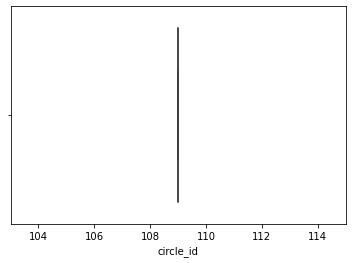

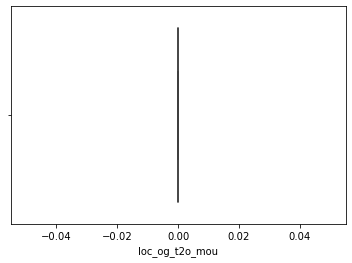

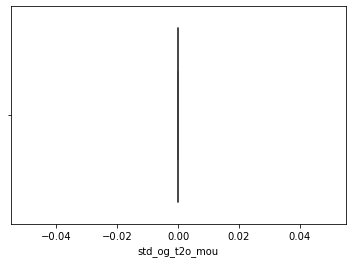

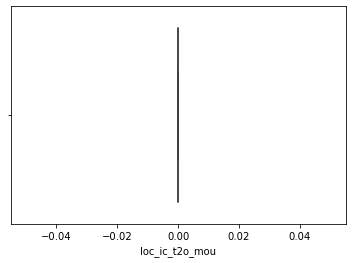

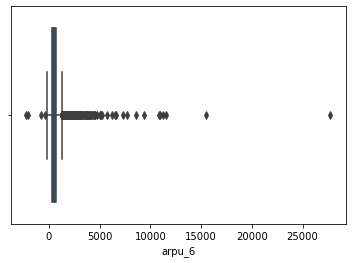

...

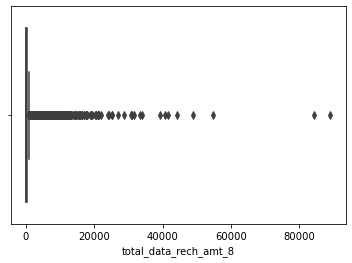

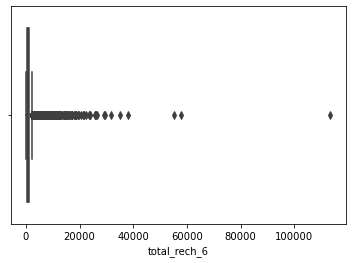

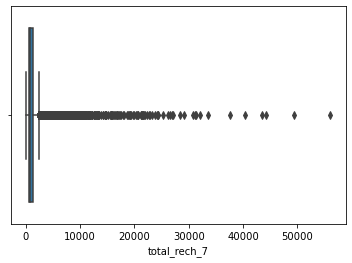

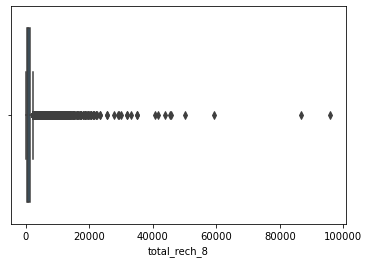

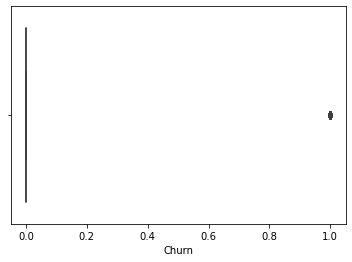

In [325]:
# Checking for outliers in the given data 
for column in numerical:
    sns.boxplot(data_model[column])
    plt.show()

As it can be seen that there are outliers present in the dataset hence outlier treatement has to be performed

In [326]:
# Defining an outlier treatment function so that outliers can be treated properly. 
def outlier_treatment(column_name):
    q1=data_model[column_name].describe(percentiles=[.05,.95]).loc["5%"]
    q3=data_model[column_name].describe(percentiles=[.05,.95]).loc["95%"]
    iqr=q3-q1
    up_bd=q3+1.5*iqr
    lo_bd=q1-1.5*iqr
    data_model[column_name]=np.where(data_model[column_name]>up_bd,up_bd,data_model[column_name])##Capping
    data_model[column_name]=np.where(data_model[column_name]<lo_bd,lo_bd,data_model[column_name])##flooring

In [327]:
# Outlier Treatment
for columns in numerical:
    outlier_treatment(columns)

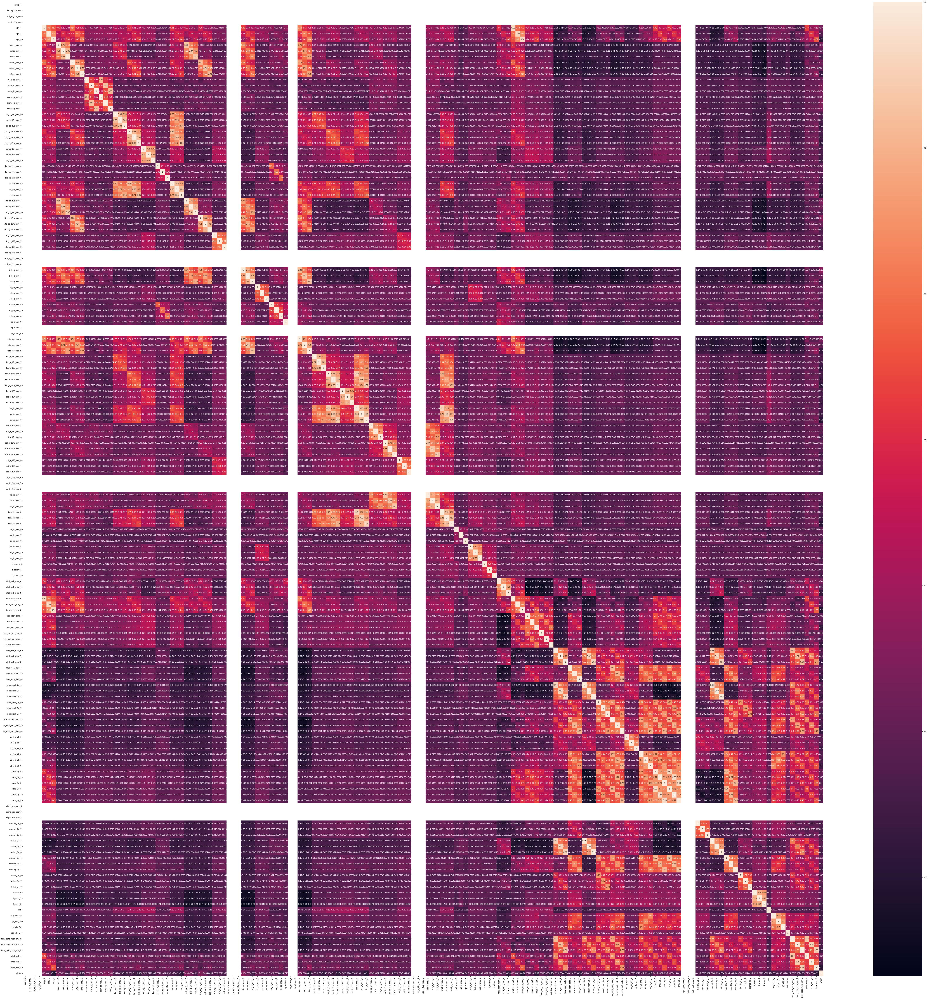

In [328]:
# Finding the correlation between the data
plt.figure(figsize=(100,100))
sns.heatmap(data_model[numerical].corr(),annot=True)
plt.show()

In [329]:
fig=plt.subplots(figsize=(100, 100))

for i, feature in enumerate(numerical):
    plt.subplot(57, 3, i+1)
    plt.subplots_adjust(hspace = 2.0)
    sns.scatterplot(data_model[feature], data_model['Churn'])
    plt.tight_layout()

## Scaling

In [330]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [331]:
data_model.max()

mobile_number            7002410905
circle_id                     109.0
loc_og_t2o_mou                  0.0
std_og_t2o_mou                  0.0
loc_ic_t2o_mou                  0.0
last_date_of_month_6      6/30/2014
last_date_of_month_7      7/31/2014
last_date_of_month_8      8/31/2014
arpu_6                     2933.645
arpu_7                    2981.7705
arpu_8                    3123.2225
onnet_mou_6                  2838.6
onnet_mou_7                2964.475
onnet_mou_8                2686.475
offnet_mou_6                3141.21
offnet_mou_7                3180.65
offnet_mou_8                2918.85
roam_ic_mou_6                211.35
roam_ic_mou_7                 139.1
roam_ic_mou_8               140.875
roam_og_mou_6               363.525
roam_og_mou_7                 260.6
roam_og_mou_8               251.275
loc_og_t2t_mou_6             806.85
loc_og_t2t_mou_7            810.975
loc_og_t2t_mou_8             746.95
loc_og_t2m_mou_6            1510.95
loc_og_t2m_mou_7            

In [332]:
## Dropping columns with all values as 0
data_model = data_model.drop(columns=["loc_og_t2o_mou", "std_og_t2o_mou", "loc_ic_t2o_mou", "std_og_t2c_mou_6", "std_og_t2c_mou_7", "std_og_t2c_mou_8","std_ic_t2o_mou_6", "std_ic_t2o_mou_7", "std_ic_t2o_mou_8"], axis=1)

In [333]:
# Checking outliers at 25%,50%,75%,90%,95% and 99%
data_model.describe(percentiles=[.25,.5,.75,.90,.95,.99])

,mobile_number,circle_id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_data_rech_amt_6,total_data_rech_amt_7,total_data_rech_amt_8,total_rech_6,total_rech_7,total_rech_8,Churn
count,3.000100e+04,30001.0,30001.000000,30001.00000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.00000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.0,30001.0,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.00000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,16756.000000,17057.000000,15953.000000,16756.000000,17057.000000

In [334]:
## Splitting data in to X and y 
X = data_model[["arpu_6", "arpu_7", "arpu_8", "onnet_mou_6", "onnet_mou_7", "onnet_mou_8", "offnet_mou_6", "offnet_mou_7", "offnet_mou_8", "roam_ic_mou_6", "roam_ic_mou_7", "roam_ic_mou_8", "roam_og_mou_6", "roam_og_mou_7", "roam_og_mou_8", "loc_og_t2t_mou_6", "loc_og_t2t_mou_7", "loc_og_t2t_mou_8", "loc_og_t2m_mou_6", "loc_og_t2m_mou_7", "loc_og_t2m_mou_8", "loc_og_t2f_mou_6", "loc_og_t2f_mou_7", "loc_og_t2f_mou_8", "loc_og_t2c_mou_6", "loc_og_t2c_mou_7", "loc_og_t2c_mou_8", "loc_og_mou_6", "loc_og_mou_7", "loc_og_mou_8", "std_og_t2t_mou_6", "std_og_t2t_mou_7", "std_og_t2t_mou_8", "std_og_t2m_mou_6", "std_og_t2m_mou_7", "std_og_t2m_mou_8", "std_og_t2f_mou_6", "std_og_t2f_mou_7", "std_og_t2f_mou_8", "std_og_mou_6", "std_og_mou_7", "std_og_mou_8", "isd_og_mou_6", "isd_og_mou_7", "isd_og_mou_8", "spl_og_mou_6", "spl_og_mou_7", "spl_og_mou_8", "og_others_6", "og_others_7", "og_others_8", "total_og_mou_6", "total_og_mou_7", "total_og_mou_8", "loc_ic_t2t_mou_6", "loc_ic_t2t_mou_7", "loc_ic_t2t_mou_8", "loc_ic_t2m_mou_6", "loc_ic_t2m_mou_7", "loc_ic_t2m_mou_8", "loc_ic_t2f_mou_6", "loc_ic_t2f_mou_7", "loc_ic_t2f_mou_8", "loc_ic_mou_6", "loc_ic_mou_7", "loc_ic_mou_8", "std_ic_t2t_mou_6", "std_ic_t2t_mou_7", "std_ic_t2t_mou_8", "std_ic_t2m_mou_6", "std_ic_t2m_mou_7", "std_ic_t2m_mou_8", "std_ic_t2f_mou_6", "std_ic_t2f_mou_7", "std_ic_t2f_mou_8", "std_ic_mou_6", "std_ic_mou_7", "std_ic_mou_8", "total_ic_mou_6", "total_ic_mou_7", "total_ic_mou_8", "spl_ic_mou_6", "spl_ic_mou_7", "spl_ic_mou_8", "isd_ic_mou_6", "isd_ic_mou_7", "isd_ic_mou_8", "ic_others_6", "ic_others_7", "ic_others_8", "total_rech_num_6", "total_rech_num_7", "total_rech_num_8", "total_rech_amt_6", "total_rech_amt_7", "total_rech_amt_8", "max_rech_amt_6", "max_rech_amt_7", "max_rech_amt_8", "last_day_rch_amt_6", "last_day_rch_amt_7", "last_day_rch_amt_8", "total_rech_data_6", "total_rech_data_7", "total_rech_data_8", "max_rech_data_6", "max_rech_data_7", "max_rech_data_8", "count_rech_2g_6", "count_rech_2g_7", "count_rech_2g_8", "count_rech_3g_6", "count_rech_3g_7", "count_rech_3g_8", "av_rech_amt_data_6", "av_rech_amt_data_7", "av_rech_amt_data_8", "vol_2g_mb_6", "vol_2g_mb_7", "vol_2g_mb_8", "vol_3g_mb_6", "vol_3g_mb_7", "vol_3g_mb_8", "arpu_3g_6", "arpu_3g_7", "arpu_3g_8", "arpu_2g_6", "arpu_2g_7", "arpu_2g_8", "night_pck_user_6", "night_pck_user_7", "night_pck_user_8", "monthly_2g_6", "monthly_2g_7", "monthly_2g_8", "sachet_2g_6", "sachet_2g_7", "sachet_2g_8", "monthly_3g_6", "monthly_3g_7", "monthly_3g_8", "sachet_3g_6", "sachet_3g_7", "sachet_3g_8", "fb_user_6", "fb_user_7", "fb_user_8", "aon", "aug_vbc_3g", "jul_vbc_3g", "jun_vbc_3g", "sep_vbc_3g", "total_data_rech_amt_6", "total_data_rech_amt_7", "total_data_rech_amt_8", "total_rech_6", "total_rech_7", "total_rech_8"]]
y = data_model.Churn

In [335]:
X.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_data_rech_amt_6,total_data_rech_amt_7,total_data_rech_amt_8,total_rech_6,total_rech_7,total_rech_8
0,197.385,214.816,213.8030,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.000,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,4.13,0.00,0.00,1.15,0.00,0.00,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.000,0.00,0.00,0.00,0.00,0.00,0.00,5.44,0.00,0.0,0.0,0.00,0.00,0.00,0.000,0.000,0.000,4.0,3.0,2.0,362.0,252.0,252.0,252.0,252.0,252.0,252.0,252.0,252.0,1.0,1.0,1.0,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,252.0,252.0,252.0,30.13,1.32,5.75,83.57,150.76,109.61,212.17,212.17,212.17,212.17,212.17,212.17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,968.0,30.40,0.00,101.20,3.58,252.0,252.0,252.0,614.0,504.0,504.0
7,1069.180,1349.850,3123.2225,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,16.7,14.825,60.86,75.14,77.84,0.0,0.18,0.9,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,27.95,28.825,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,8.525,11.475,9.325,5.0,5.0,7.0,1580.0,790.0,3638.0,1110.0,790.0,1100.0,0.0,0.0,630.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,802.0,57.74,19.38,18.74,0.00,0.0,0.0,0.0,1580.0,790.0,3638.0
8,378.721,492.223,137.3620,413.69

In [336]:
X.shape

(30001, 158)

In [337]:
100 * (X.isnull().sum()/len(X))

arpu_6                    0.000000
arpu_7                    0.000000
arpu_8                    0.000000
onnet_mou_6               0.000000
onnet_mou_7               0.000000
onnet_mou_8               0.000000
offnet_mou_6              0.000000
offnet_mou_7              0.000000
offnet_mou_8              0.000000
roam_ic_mou_6             0.000000
roam_ic_mou_7             0.000000
roam_ic_mou_8             0.000000
roam_og_mou_6             0.000000
roam_og_mou_7             0.000000
roam_og_mou_8             0.000000
loc_og_t2t_mou_6          0.000000
loc_og_t2t_mou_7          0.000000
loc_og_t2t_mou_8          0.000000
loc_og_t2m_mou_6          0.000000
loc_og_t2m_mou_7          0.000000
loc_og_t2m_mou_8          0.000000
loc_og_t2f_mou_6          0.000000
loc_og_t2f_mou_7          0.000000
loc_og_t2f_mou_8          0.000000
loc_og_t2c_mou_6          0.000000
loc_og_t2c_mou_7          0.000000
loc_og_t2c_mou_8          0.000000
loc_og_mou_6              0.000000
loc_og_mou_7        

In [338]:
## Fill 0 to arpu_3g and arpu_2g and night_pck
X = X.fillna(0)

In [339]:
X.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_data_rech_amt_6,total_data_rech_amt_7,total_data_rech_amt_8,total_rech_6,total_rech_7,total_rech_8
0,197.385,214.816,213.8030,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.000,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,4.13,0.00,0.00,1.15,0.00,0.00,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.000,0.00,0.00,0.00,0.00,0.00,0.00,5.44,0.00,0.0,0.0,0.00,0.00,0.00,0.000,0.000,0.000,4.0,3.0,2.0,362.0,252.0,252.0,252.0,252.0,252.0,252.0,252.0,252.0,1.0,1.0,1.0,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,252.0,252.0,252.0,30.13,1.32,5.75,83.57,150.76,109.61,212.17,212.17,212.17,212.17,212.17,212.17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,968.0,30.40,0.00,101.20,3.58,252.0,252.0,252.0,614.0,504.0,504.0
7,1069.180,1349.850,3123.2225,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,16.7,14.825,60.86,75.14,77.84,0.0,0.18,0.9,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,27.95,28.825,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,8.525,11.475,9.325,5.0,5.0,7.0,1580.0,790.0,3638.0,1110.0,790.0,1100.0,0.0,0.0,630.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,802.0,57.74,19.38,18.74,0.00,0.0,0.0,0.0,1580.0,790.0,3638.0
8,378.721,492.223,137.3620,

In [340]:
100 * (X.isnull().sum()/len(X))

arpu_6                   0.0
arpu_7                   0.0
arpu_8                   0.0
onnet_mou_6              0.0
onnet_mou_7              0.0
onnet_mou_8              0.0
offnet_mou_6             0.0
offnet_mou_7             0.0
offnet_mou_8             0.0
roam_ic_mou_6            0.0
roam_ic_mou_7            0.0
roam_ic_mou_8            0.0
roam_og_mou_6            0.0
roam_og_mou_7            0.0
roam_og_mou_8            0.0
loc_og_t2t_mou_6         0.0
loc_og_t2t_mou_7         0.0
loc_og_t2t_mou_8         0.0
loc_og_t2m_mou_6         0.0
loc_og_t2m_mou_7         0.0
loc_og_t2m_mou_8         0.0
loc_og_t2f_mou_6         0.0
loc_og_t2f_mou_7         0.0
loc_og_t2f_mou_8         0.0
loc_og_t2c_mou_6         0.0
loc_og_t2c_mou_7         0.0
loc_og_t2c_mou_8         0.0
loc_og_mou_6             0.0
loc_og_mou_7             0.0
loc_og_mou_8             0.0
std_og_t2t_mou_6         0.0
std_og_t2t_mou_7         0.0
std_og_t2t_mou_8         0.0
std_og_t2m_mou_6         0.0
std_og_t2m_mou

In [341]:
# Creating new features according to need

X["roam_any_6"] = X[["roam_ic_mou_6", "roam_og_mou_6"]].sum(axis = 1)
X["roam_any_7"] = X[["roam_ic_mou_7", "roam_og_mou_7"]].sum(axis = 1)
X["roam_any_8"] = X[["roam_ic_mou_8", "roam_og_mou_8"]].sum(axis = 1)

X["roam_any_6"] = X["roam_any_6"].apply(lambda x: 1 if (x>0) else 0)
X["roam_any_7"] = X["roam_any_7"].apply(lambda x: 1 if (x>0) else 0)
X["roam_any_8"] = X["roam_any_8"].apply(lambda x: 1 if (x>0) else 0)

## Add all local ic and og columns and add a new column which says if local value is true for data
X["local_any_6"] = X[["loc_og_t2t_mou_6", "loc_og_t2m_mou_6", "loc_og_t2f_mou_6", "loc_og_t2c_mou_6", "loc_og_mou_6", "loc_ic_t2t_mou_6", "loc_ic_t2m_mou_6", "loc_ic_t2f_mou_6", "loc_ic_mou_6"]].sum(axis=1)
X["local_any_7"] = X[["loc_og_t2t_mou_7", "loc_og_t2m_mou_7", "loc_og_t2f_mou_7", "loc_og_t2c_mou_7", "loc_og_mou_7", "loc_ic_t2t_mou_7", "loc_ic_t2m_mou_7", "loc_ic_t2f_mou_7", "loc_ic_mou_7"]].sum(axis=1)
X["local_any_8"] = X[["loc_og_t2t_mou_8", "loc_og_t2m_mou_8", "loc_og_t2f_mou_8", "loc_og_t2c_mou_8", "loc_og_mou_8", "loc_ic_t2t_mou_8", "loc_ic_t2m_mou_8", "loc_ic_t2f_mou_8", "loc_ic_mou_8"]].sum(axis=1)

X["local_any_6"] = X["local_any_6"].apply(lambda x: 1 if (x > 0) else 0)
X["local_any_7"] = X["local_any_7"].apply(lambda x: 1 if (x > 0) else 0)
X["local_any_8"] = X["local_any_8"].apply(lambda x: 1 if (x > 0) else 0)

## Add all std ic and og columns and add a new column which says if std value is true for data
X["std_any_6"] = X[["std_og_t2t_mou_6", "std_og_t2m_mou_6", "std_og_t2f_mou_6", "std_og_mou_6", "std_ic_t2t_mou_6", "std_ic_t2m_mou_6", "std_ic_t2f_mou_6", "std_ic_mou_6"]].sum(axis=1)
X["std_any_7"] = X[["std_og_t2t_mou_7", "std_og_t2m_mou_7", "std_og_t2f_mou_7", "std_og_mou_7", "std_ic_t2t_mou_7", "std_ic_t2m_mou_7", "std_ic_t2f_mou_7", "std_ic_mou_7"]].sum(axis=1)
X["std_any_8"] = X[["std_og_t2t_mou_8", "std_og_t2m_mou_8", "std_og_t2f_mou_8", "std_og_mou_8", "std_ic_t2t_mou_8", "std_ic_t2m_mou_8", "std_ic_t2f_mou_8", "std_ic_mou_8"]].sum(axis=1)

X["std_any_6"] = X["std_any_6"].apply(lambda x: 1 if (x > 0) else 0)
X["std_any_7"] = X["std_any_7"].apply(lambda x: 1 if (x > 0) else 0)
X["std_any_8"] = X["std_any_8"].apply(lambda x: 1 if (x > 0) else 0)

## Add all isd & spl ic and og columns and add a new column which says if spl value is true for data
X["spl_any_6"] = X[["isd_og_mou_6", "spl_og_mou_6", "og_others_6", "spl_ic_mou_6", "isd_ic_mou_6", "ic_others_6"]].sum(axis=1)
X["spl_any_7"] = X[["isd_og_mou_7", "spl_og_mou_7", "og_others_7", "spl_ic_mou_7", "isd_ic_mou_7", "ic_others_7"]].sum(axis=1)
X["spl_any_8"] = X[["isd_og_mou_8", "spl_og_mou_8", "og_others_8", "spl_ic_mou_8", "isd_ic_mou_8", "ic_others_8"]].sum(axis=1)

X["spl_any_6"] = X["spl_any_6"].apply(lambda x: 1 if (x > 0) else 0)
X["spl_any_7"] = X["spl_any_7"].apply(lambda x: 1 if (x > 0) else 0)
X["spl_any_8"] = X["spl_any_8"].apply(lambda x: 1 if (x > 0) else 0)

## Data used 2g and 3g
X["data_used_6"] = X[["vol_2g_mb_6", "vol_3g_mb_6", "jun_vbc_3g"]].sum(axis=1)
X["data_used_7"] = X[["vol_2g_mb_7", "vol_3g_mb_7", "jul_vbc_3g"]].sum(axis=1)
X["data_used_8"] = X[["vol_2g_mb_8", "vol_3g_mb_8", "aug_vbc_3g"]].sum(axis=1)

X.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_data_rech_amt_6,total_data_rech_amt_7,total_data_rech_amt_8,total_rech_6,total_rech_7,total_rech_8,roam_any_6,roam_any_7,roam_any_8,local_any_6,local_any_7,local_any_8,std_any_6,std_any_7,std_any_8,spl_any_6,spl_any_7,spl_any_8,data_used_6,data_used_7,data_used_8
0,197.385,214.816,213.8030,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.000,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,4.13,0.00,0.00,1.15,0.00,0.00,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.000,0.00,0.00,0.00,0.00,0.00,0.00,5.44,0.00,0.0,0.0,0.00,0.00,0.00,0.000,0.000,0.000,4.0,3.0,2.0,362.0,252.0,252.0,252.0,252.0,252.0,252.0,252.0,252.0,1.0,1.0,1.0,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,252.0,252.0,252.0,30.13,1.32,5.75,83.57,150.76,109.61,212.17,212.17,212.17,212.17,212.17,212.17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,968.0,30.40,0.00,101.20,3.58,252.0,252.0,252.0,614.0,504.0,504.0,0,0,0,0,0,1,0,0,0,0,0,0,214.90,152.08,145.76
7,1069.180,1349.850,3123.2225,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,16.7,14.825,60.86,75.14,77.84,0.0,0.18,0.9,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,27.95,28.825,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,8.525,11.475,9.325,5.0,5.0,7.0,1580.0,790.0,3638.0,1110.0,790.0,1100.0,0.0,0.0,630.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,

In [342]:
## removing unwanted columns
X = X.drop(columns=["max_rech_amt_6", "max_rech_amt_7", "max_rech_amt_8", "max_rech_data_6", "max_rech_data_7", "max_rech_data_8"])
X = X.drop(columns=["isd_og_mou_6", "isd_og_mou_7", "isd_og_mou_8", "spl_og_mou_6", "spl_og_mou_7", "spl_og_mou_8", "og_others_6", "og_others_7", "og_others_8",  "spl_ic_mou_6", "spl_ic_mou_7", "spl_ic_mou_8", "isd_ic_mou_6", "isd_ic_mou_7", "isd_ic_mou_8", "ic_others_6", "ic_others_7", "ic_others_8"])
X = X.drop(columns=["total_rech_data_6", "total_rech_data_7", "total_rech_data_8", "av_rech_amt_data_6", "av_rech_amt_data_7", "av_rech_amt_data_8", "total_data_rech_amt_6", "total_data_rech_amt_7", "total_data_rech_amt_8"])
X = X.drop(columns=["std_og_t2t_mou_6", "std_og_t2t_mou_7", "std_og_t2t_mou_8", "std_og_t2m_mou_6", "std_og_t2m_mou_7", "std_og_t2m_mou_8", "std_og_t2f_mou_6", "std_og_t2f_mou_7", "std_og_t2f_mou_8", "std_og_mou_6", "std_og_mou_7", "std_og_mou_8", "std_ic_t2t_mou_6", "std_ic_t2t_mou_7", "std_ic_t2t_mou_8", "std_ic_t2m_mou_6", "std_ic_t2m_mou_7", "std_ic_t2m_mou_8", "std_ic_t2f_mou_6", "std_ic_t2f_mou_7", "std_ic_t2f_mou_8", "std_ic_mou_6", "std_ic_mou_7", "std_ic_mou_8"])
X = X.drop(columns=["loc_og_t2t_mou_6", "loc_og_t2t_mou_7", "loc_og_t2t_mou_8", "loc_og_t2m_mou_6", "loc_og_t2m_mou_7", "loc_og_t2m_mou_8", "loc_og_t2f_mou_6", "loc_og_t2f_mou_7", "loc_og_t2f_mou_8", "loc_og_t2c_mou_6", "loc_og_t2c_mou_7", "loc_og_t2c_mou_8", "loc_og_mou_6", "loc_og_mou_7", "loc_og_mou_8", "loc_ic_t2t_mou_6", "loc_ic_t2t_mou_7", "loc_ic_t2t_mou_8", "loc_ic_t2m_mou_6", "loc_ic_t2m_mou_7", "loc_ic_t2m_mou_8", "loc_ic_t2f_mou_6", "loc_ic_t2f_mou_7", "loc_ic_t2f_mou_8", "loc_ic_mou_6", "loc_ic_mou_7", "loc_ic_mou_8"])
X = X.drop(columns=["roam_ic_mou_6", "roam_ic_mou_7", "roam_ic_mou_8", "roam_og_mou_6", "roam_og_mou_7", "roam_og_mou_8"])
X = X.drop(columns=["vol_2g_mb_6", "vol_2g_mb_7", "vol_2g_mb_8", "vol_3g_mb_6", "vol_3g_mb_7", "vol_3g_mb_8", "aug_vbc_3g", "jul_vbc_3g", "jun_vbc_3g", "sep_vbc_3g"])
X = X.drop(columns=["total_rech_num_6", "total_rech_num_7", "total_rech_num_8", "total_rech_amt_6", "total_rech_amt_7", "total_rech_amt_8"])
X = X.drop(columns=["count_rech_2g_6", "count_rech_2g_7", "count_rech_2g_8", "count_rech_3g_6", "count_rech_3g_7", "count_rech_3g_8"])
X = X.drop(columns=["onnet_mou_6", "onnet_mou_7", "onnet_mou_8", "offnet_mou_6", "offnet_mou_7", "offnet_mou_8"])
X = X.drop(columns=["fb_user_6","fb_user_7","fb_user_8",])
X.head()

,arpu_6,arpu_7,arpu_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,total_rech_6,total_rech_7,total_rech_8,roam_any_6,roam_any_7,roam_any_8,local_any_6,local_any_7,local_any_8,std_any_6,std_any_7,std_any_8,spl_any_6,spl_any_7,spl_any_8,data_used_6,data_used_7,data_used_8
0,197.385,214.816,213.8030,0.00,0.00,0.00,0.00,0.00,5.44,252.0,252.0,252.0,212.17,212.17,212.17,212.17,212.17,212.17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,968.0,614.0,504.0,504.0,0,0,0,0,0,1,0,0,0,0,0,0,214.90,152.08,145.76
7,1069.180,1349.850,3123.2225,487.53,609.24,350.16,626.46,558.04,428.74,0.0,0.0,630.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,802.0,1580.0,790.0,3638.0,1,1,1,1,1,1,1,1,1,1,1,1,18.74,19.38,57.74
8,378.721,492.223,137.3620,508.36,431.66,171.56,103.86,28.49,16.54,50.0,0.0,10.0,0.00,0.00,19.83,0.00,0.00,0.00,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,315.0,437.0,955.0,327.0,0,0,0,1,1,1,1,1,1,0,0,1,122.16,2017.60,33.00
21,514.453,597.753,637.7600,860.34,1028.79,1068.54,207.09,131.89,261.04,30.0,20.0,50.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,720.0,600.0,680.0,718.0,0,0,0,1,1,1,1,1,1,0,0,0,0.00,0.00,0.00
23,74.350,193.897,366.9660,134.38,140.04,239.48,119.58,222.89,298.33,0.0,179.0,0.0,0.00,306.57,197.27,0.00,301.78,150.67,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,0.0,0.0,1.0,604.0,0.0,1166.0,979.0,0,0,0,1,1,1,1,1,1,1,1,1,0.00,651.43,1050.38


In [343]:
list(X.columns)

['arpu_6',
 'arpu_7',
 'arpu_8',
 'total_og_mou_6',
 'total_og_mou_7',
 'total_og_mou_8',
 'total_ic_mou_6',
 'total_ic_mou_7',
 'total_ic_mou_8',
 'last_day_rch_amt_6',
 'last_day_rch_amt_7',
 'last_day_rch_amt_8',
 'arpu_3g_6',
 'arpu_3g_7',
 'arpu_3g_8',
 'arpu_2g_6',
 'arpu_2g_7',
 'arpu_2g_8',
 'night_pck_user_6',
 'night_pck_user_7',
 'night_pck_user_8',
 'monthly_2g_6',
 'monthly_2g_7',
 'monthly_2g_8',
 'sachet_2g_6',
 'sachet_2g_7',
 'sachet_2g_8',
 'monthly_3g_6',
 'monthly_3g_7',
 'monthly_3g_8',
 'sachet_3g_6',
 'sachet_3g_7',
 'sachet_3g_8',
 'aon',
 'total_rech_6',
 'total_rech_7',
 'total_rech_8',
 'roam_any_6',
 'roam_any_7',
 'roam_any_8',
 'local_any_6',
 'local_any_7',
 'local_any_8',
 'std_any_6',
 'std_any_7',
 'std_any_8',
 'spl_any_6',
 'spl_any_7',
 'spl_any_8',
 'data_used_6',
 'data_used_7',
 'data_used_8']

In [344]:
# splitting the data into test and train

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=42)

In [345]:
## Scaling only features which are numeric
X_train[["arpu_6", "arpu_7", "arpu_8", "total_og_mou_6", "total_og_mou_7", "total_og_mou_8", "total_ic_mou_6", "total_ic_mou_7", "total_ic_mou_8", "last_day_rch_amt_6", "last_day_rch_amt_7", "last_day_rch_amt_8", "arpu_3g_6", "arpu_3g_7", "arpu_3g_8", "arpu_2g_6", "arpu_2g_7", "arpu_2g_8", "night_pck_user_6", "night_pck_user_7", "night_pck_user_8", "monthly_2g_6", "monthly_2g_7", "monthly_2g_8", "sachet_2g_6", "sachet_2g_7", "sachet_2g_8", "monthly_3g_6", "monthly_3g_7", "monthly_3g_8", "sachet_3g_6", "sachet_3g_7", "sachet_3g_8", "aon", "total_rech_6", "total_rech_7", "total_rech_8", "roam_any_6", "roam_any_7", "roam_any_8", "local_any_6", "local_any_7", "local_any_8", "std_any_6", "std_any_7", "std_any_8", "spl_any_6", "spl_any_7", "spl_any_8", "data_used_6", "data_used_7", "data_used_8"]] = scaler.fit_transform(X_train[["arpu_6", "arpu_7", "arpu_8", "total_og_mou_6", "total_og_mou_7", "total_og_mou_8", "total_ic_mou_6", "total_ic_mou_7", "total_ic_mou_8", "last_day_rch_amt_6", "last_day_rch_amt_7", "last_day_rch_amt_8", "arpu_3g_6", "arpu_3g_7", "arpu_3g_8", "arpu_2g_6", "arpu_2g_7", "arpu_2g_8", "night_pck_user_6", "night_pck_user_7", "night_pck_user_8", "monthly_2g_6", "monthly_2g_7", "monthly_2g_8", "sachet_2g_6", "sachet_2g_7", "sachet_2g_8", "monthly_3g_6", "monthly_3g_7", "monthly_3g_8", "sachet_3g_6", "sachet_3g_7", "sachet_3g_8", "aon", "total_rech_6", "total_rech_7", "total_rech_8", "roam_any_6", "roam_any_7", "roam_any_8", "local_any_6", "local_any_7", "local_any_8", "std_any_6", "std_any_7", "std_any_8", "spl_any_6", "spl_any_7", "spl_any_8", "data_used_6", "data_used_7", "data_used_8"]])
X_test[["arpu_6", "arpu_7", "arpu_8", "total_og_mou_6", "total_og_mou_7", "total_og_mou_8", "total_ic_mou_6", "total_ic_mou_7", "total_ic_mou_8", "last_day_rch_amt_6", "last_day_rch_amt_7", "last_day_rch_amt_8", "arpu_3g_6", "arpu_3g_7", "arpu_3g_8", "arpu_2g_6", "arpu_2g_7", "arpu_2g_8", "night_pck_user_6", "night_pck_user_7", "night_pck_user_8", "monthly_2g_6", "monthly_2g_7", "monthly_2g_8", "sachet_2g_6", "sachet_2g_7", "sachet_2g_8", "monthly_3g_6", "monthly_3g_7", "monthly_3g_8", "sachet_3g_6", "sachet_3g_7", "sachet_3g_8", "aon", "total_rech_6", "total_rech_7", "total_rech_8", "roam_any_6", "roam_any_7", "roam_any_8", "local_any_6", "local_any_7", "local_any_8", "std_any_6", "std_any_7", "std_any_8", "spl_any_6", "spl_any_7", "spl_any_8", "data_used_6", "data_used_7", "data_used_8"]] = scaler.transform(X_test[["arpu_6", "arpu_7", "arpu_8", "total_og_mou_6", "total_og_mou_7", "total_og_mou_8", "total_ic_mou_6", "total_ic_mou_7", "total_ic_mou_8", "last_day_rch_amt_6", "last_day_rch_amt_7", "last_day_rch_amt_8", "arpu_3g_6", "arpu_3g_7", "arpu_3g_8", "arpu_2g_6", "arpu_2g_7", "arpu_2g_8", "night_pck_user_6", "night_pck_user_7", "night_pck_user_8", "monthly_2g_6", "monthly_2g_7", "monthly_2g_8", "sachet_2g_6", "sachet_2g_7", "sachet_2g_8", "monthly_3g_6", "monthly_3g_7", "monthly_3g_8", "sachet_3g_6", "sachet_3g_7", "sachet_3g_8", "aon", "total_rech_6", "total_rech_7", "total_rech_8", "roam_any_6", "roam_any_7", "roam_any_8", "local_any_6", "local_any_7", "local_any_8", "std_any_6", "std_any_7", "std_any_8", "spl_any_6", "spl_any_7", "spl_any_8", "data_used_6", "data_used_7", "data_used_8"]])

In [346]:
##X_train = pd.DataFrame(X_train, columns=X.columns)
X_train.head()

,arpu_6,arpu_7,arpu_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,total_rech_6,total_rech_7,total_rech_8,roam_any_6,roam_any_7,roam_any_8,local_any_6,local_any_7,local_any_8,std_any_6,std_any_7,std_any_8,spl_any_6,spl_any_7,spl_any_8,data_used_6,data_used_7,data_used_8
65002,-0.044537,0.220738,-1.226929,-0.817548,-0.774078,-0.823024,-0.643865,-0.631917,-0.826573,0.950704,-0.867973,-0.801509,5.324784,2.221656,-0.387767,3.752288,2.250293,-0.404519,0.0,0.0,0.0,-0.404881,-0.411920,-0.382212,-0.436786,-0.454731,-0.433164,3.500402,1.498772,-0.377061,-0.314153,-0.308542,-0.281961,-0.154751,0.747880,-0.018648,-0.875328,-0.538742,-0.462995,-0.479220,0.19849,0.188422,-3.631692,0.407931,0.407057,-2.115628,-1.761808,-1.675442,-1.587992,2.827091,1.767729,-0.566102
67088,-0.249055,-0.102047,-0.216851,0.634580,0.079040,-0.421657,-0.241154,-0.170876,-0.210774,0.125374,-0.282195,-0.620209,-0.403845,-0.401582,-0.387767,-0.430501,-0.426448,-0.404519,0.0,0.0,0.0,-0.404881,-0.411920,-0.382212,-0.436786,-0.454731,-0.433164,-0.391559,-0.392480,-0.377061,-0.314153,-0.308542,-0.281961,-0.785536,-0.398621,-0.563068,-0.466619,-0.538742,2.159851,2.086723,0.19849,0.188422,0.275354,0.407931,0.407057,0.472673,0.567599,0.596857,0.629726,-0.581601,-0.594084,-0.566102
36410,-0.516880,-0.662501,-0.546312,-0.413079,-0.502290,-0.395783,-0.538312,-0.583946,-0.533089,-0.268951,0.303582,-0.801509,-0.403845,-0.401582,-0.387767,-0.430501,-0.426173,-0.404234,0.0,0.0,0.0,-0.404881,-0.411920,-0.382212,0.408256,1.073562,2.093741,-0.391559,-0.392480,-0.377061,-0.314153,-0.308542,-0.281961,2.096858,-0.630735,-0.259502,0.109448,-0.538742,-0.462995,-0.479220,0.19849,0.188422,0.275354,0.407931,0.407057,0.472673,0.567599,0.596857,0.629726,-0.581601,-0.594084,-0.566102
90870,0.024606,0.429637,0.305301,0.877614,1.121575,1.457452,-0.470606,-0.444423,-0.738764,0.125374,-0.471447,0.503855,-0.403845,-0.401582,-0.387767,-0.430501,-0.426448,-0.404519,0.0,0.0,0.0,-0.404881,1.839008,-0.382212,-0.436786,-0.454731,-0.433164,-0.391559,-0.392480,-0.377061,-0.314153,-0.308542,-0.281961,-0.778226,-0.405655,-0.094994,-0.228793,-0.538742,-0.462995,-0.479220,0.19849,0.188422,0.275354,0.407931,0.407057,0.472673,0.567599,0.596857,0.629726,-0.581601,0.347635,-0.566102
50581,-0.629604,-1.178690,-0.814896,-0.816214,-0.844396,-0.752487,-0.505613,-0.493154,-0.386243,-0.424846,-0.777853,-0.529558,-0.403845,-0.401582,-0.387767,-0.379571,-0.420943,-0.386637,0.0,0.0,0.0,-0.404881,-0.411920,-0.382212,2.520863,1.455636,3.357194,-0.391559,-0.392480,-0.377061,-0.314153,-0.308542,-0.281961,-1.025736,0.492656,-0.354934,1.080131,-0.538742,-0.462995,-0.479220,0.19849,0.188422,0.275354,0.407931,-2.456659,-2.115628,0.567599,0.596857,0.629726,-0.054998,-0.345096,-0.134117


## PCA without modelling

In [347]:
## Improting the PCA module
from sklearn.decomposition import PCA
pca = PCA(svd_solver="randomized", random_state=50)
## Doing the PCA on the train data
pca.fit(X_train)
pca.components_

array([[ 7.18930400e-02,  8.30906955e-02,  9.41085279e-02, ...,
         2.43792460e-01,  2.53800630e-01,  2.52481437e-01],
       [ 2.60746077e-01,  3.02162383e-01,  2.98011737e-01, ...,
        -6.87416801e-02, -5.65991501e-02, -3.03338554e-02],
       [-4.17742869e-02,  9.23523690e-03,  5.15863209e-02, ...,
         5.98101487e-03,  3.46658751e-02,  5.11026654e-02],
       ...,
       [-0.00000000e+00, -9.53376080e-18,  4.11846359e-17, ...,
        -9.94746608e-17, -3.08116621e-17,  5.67378284e-17],
       [ 0.00000000e+00, -7.40743781e-17,  9.15336827e-17, ...,
         4.18482997e-17,  8.46738421e-17, -9.45334822e-17],
       [ 0.00000000e+00, -3.12686816e-16,  3.93870439e-16, ...,
         1.81958117e-16, -1.37323991e-16,  3.60764254e-16]])

In [348]:
## Verifying PC and variables
col_names = list(X_train.columns)
pcs_df = pd.DataFrame({"PC1":pca.components_[0],"PC2":pca.components_[1], "Feature":col_names})
pcs_df.head(20)

,PC1,PC2,Feature
0,0.071893,0.260746,arpu_6
1,0.083091,0.302162,arpu_7
2,0.094109,0.298012,arpu_8
3,-0.060100,0.263220,total_og_mou_6
4,-0.059010,0.296877,total_og_mou_7
5,-0.041231,0.292843,total_og_mou_8
6,0.007182,0.191409,total_ic_mou_6
7,0.011281,0.213531,total_ic_mou_7
8,0.018243,0.212666,total_ic_mou_8
9,0.083026,0.104641,last_day_rch_amt_6


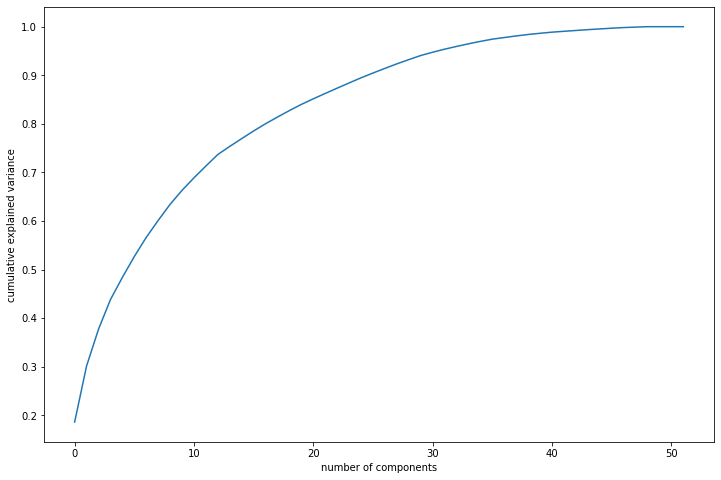

In [349]:
#Making the screeplot - plotting the cumulative variance against the number of components
%matplotlib inline
fig = plt.figure(figsize = (12,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("number of components")
plt.ylabel("cumulative explained variance")
plt.show()

In [350]:
#Improting the PCA module
from sklearn.decomposition import PCA
pca_1 = PCA(n_components=15, random_state=42)

In [351]:
X_train_pca_1 = pca_1.fit_transform(X_train)
X_train_pca_1.shape

(21000, 15)

<AxesSubplot:>

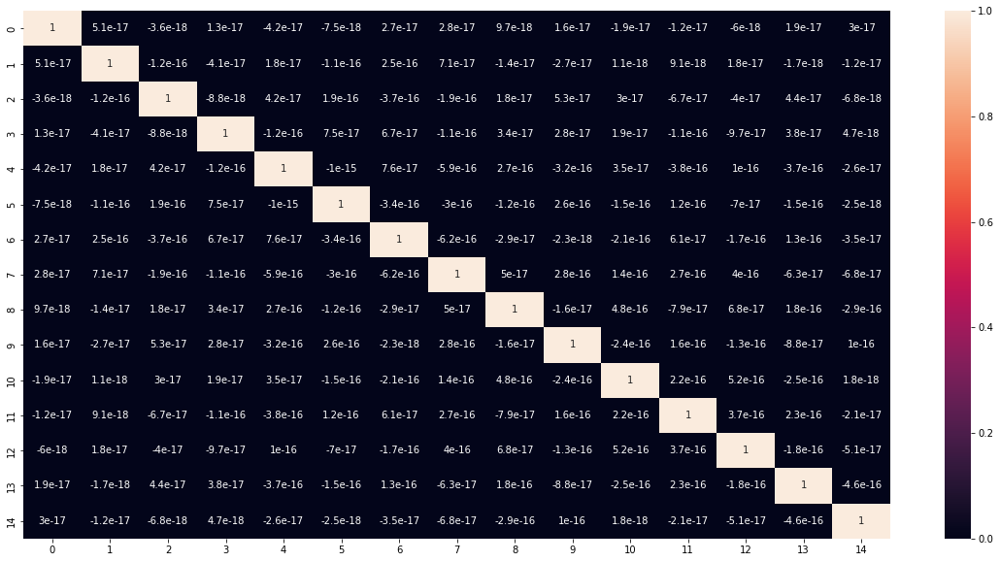

In [352]:
#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (20,10))
sns.heatmap(np.corrcoef(X_train_pca_1.transpose()), annot=True)

In [353]:
#training the regression model
logsk = LogisticRegression(random_state=42)
model = logsk.fit(X_train_pca_1,y_train)

In [354]:
round(model.score(X_train_pca_1, y_train) * 100, 2)

93.88

In [355]:
X_test_pca_1 = pca_1.transform(X_test)
X_test_pca_1.shape

(9001, 15)

In [356]:
# Predicted probabilities
y_pred = logsk.predict_proba(X_train_pca_1)
# Converting y_pred to a dataframe which is an array
y_pred_df = pd.DataFrame(y_pred)
# Converting to column dataframe
y_pred_df = y_pred_df.iloc[:,[1]]
# Let's see the head
y_pred_df.head()

,1
0,0.645647
1,0.160994
2,0.013726
3,0.034036
4,0.033117


In [357]:
# Converting y_test to dataframe
y_train_df = pd.DataFrame(y_train)
y_train_df.head()

,Churn
65002,1.0
67088,0.0
36410,0.0
90870,0.0
50581,0.0


In [358]:
# Putting index
y_train_df["I"] = y_train_df.index
# Removing index for both dataframes to append them side by side 
y_pred_df.reset_index(drop=True, inplace=True)
y_train_df.reset_index(drop=True, inplace=True)
# Appending y_train_df and y_pred_df
y_pred_final = pd.concat([y_train_df,y_pred_df], axis=1)
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 1 : "Churn_Prob"})
# Rearranging the columns
y_pred_final = y_pred_final.reindex(["I", "Churn", "Churn_Prob"], axis=1)
# Let"s see the head of y_pred_final
y_pred_final.head()

,I,Churn,Churn_Prob
0,65002,1.0,0.645647
1,67088,0.0,0.160994
2,36410,0.0,0.013726
3,90870,0.0,0.034036
4,50581,0.0,0.033117


In [359]:
# Creating new column "Predicted" with 1 if Converted_Prob > 0.5 else 0
y_pred_final["Predicted"] = y_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.5 else 0)
# Let"s see the head
y_pred_final.head()

,I,Churn,Churn_Prob,Predicted
0,65002,1.0,0.645647,1
1,67088,0.0,0.160994,0
2,36410,0.0,0.013726,0
3,90870,0.0,0.034036,0
4,50581,0.0,0.033117,0


In [360]:
for i in range(10):
    y_pred_final[i/10]= y_pred_final.Churn_Prob.map(lambda x: 1 if (x > (i/10)) else 0)
y_pred_final.head()

,I,Churn,Churn_Prob,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,65002,1.0,0.645647,1,1,1,1,1,1,1,1,0,0,0
1,67088,0.0,0.160994,0,1,1,0,0,0,0,0,0,0,0
2,36410,0.0,0.013726,0,1,0,0,0,0,0,0,0,0,0
3,90870,0.0,0.034036,0,1,0,0,0,0,0,0,0,0,0
4,50581,0.0,0.033117,0,1,0,0,0,0,0,0,0,0,0


In [361]:
from sklearn import metrics
# Confusion matrix 
confusion = metrics.confusion_matrix(y_pred_final.Churn, y_pred_final.Predicted)
confusion

array([[18947,   313],
       [  973,   767]], dtype=int64)

In [362]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [363]:
# calculating the sensitivity of our logistic regression model
print("Sensitivity:", round(TP / float(TP+FN), 2) * 100)

# calculating specificity
print("specificity:", round(TN / float(TN+FP), 2) * 100)

# Calculating false postive rate - predicting churn when customer does not have churned
print("False Postive Rate:", round(FP/ float(TN+FP), 2) * 100)

# Calculating positive predictive value 
print("positive predictive value:", round(TP / float(TP+FP), 2)* 100)

# Calculating Negative predictive value
print("Negative predictive value:", round(TN / float(TN+ FN), 2) * 100)

##Let's check the overall accuracy.
print("Accuracy:", round(metrics.accuracy_score(y_pred_final.Churn, y_pred_final.Predicted), 2) * 100)



Sensitivity: 44.0
specificity: 98.0
False Postive Rate: 2.0
positive predictive value: 71.0
Negative predictive value: 95.0
Accuracy: 94.0


In [364]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label="ROC curve (area = %0.2f)" % auc_score )
    plt.plot([0, 1], [0, 1], "k--")
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate or [1 - True Negative Rate]")
    plt.ylabel("True Positive Rate")
    plt.title("Receiver operating characteristic example")
    plt.legend(loc="lower right")
    plt.show()

    return None

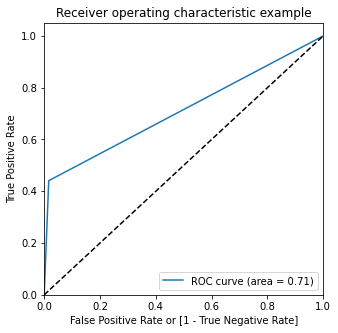

In [365]:
draw_roc(y_pred_final.Churn, y_pred_final.Predicted)

In [366]:
# Let"s create cut off matrix based on different values we have calculated
from sklearn.metrics import precision_score, recall_score

cutoff_matrix_dt = pd.DataFrame( columns = ["Probability","Accuracy","Sensitivity","Specificity","Precision","Recall"])
from sklearn.metrics import confusion_matrix

numb = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in numb:
    cm_1 = metrics.confusion_matrix(y_pred_final.Churn, y_pred_final[i] )
    total_1=sum(sum(cm_1))
    Accuracy = (cm_1[0,0] + cm_1[1,1]) / total_1
    
    Specificity = cm_1[0,0] / (cm_1[0,0] + cm_1[0,1])
    Sensitivity = cm_1[1,1] / (cm_1[1,0] + cm_1[1,1])
    Precision = precision_score(y_pred_final.Churn, y_pred_final[i])
    Recall = recall_score(y_pred_final.Churn, y_pred_final[i])
    cutoff_matrix_dt.loc[i] =[i, Accuracy, Sensitivity, Specificity, Precision, Recall]

cutoff_matrix_dt

,Probability,Accuracy,Sensitivity,Specificity,Precision,Recall
0.0,0.0,0.082857,1.000000,0.000000,0.082857,1.000000
0.1,0.1,0.885810,0.743678,0.898650,0.398644,0.743678
0.2,0.2,0.929571,0.587356,0.960488,0.573191,0.587356
0.3,0.3,0.936952,0.530460,0.973676,0.645455,0.530460
0.4,0.4,0.939095,0.490230,0.979647,0.685141,0.490230
0.5,0.5,0.938762,0.440805,0.983749,0.710185,0.440805
0.6,0.6,0.934619,0.355172,0.986968,0.711162,0.355172
0.7,0.7,0.928333,0.247126,0.989875,0.688000,0.247126
0.8,0.8,0.923238,0.133333,0.994600,0.690476,0.133333
0.9,0.9,0.918286,0.022989,0.999169,0.714286,0.022989


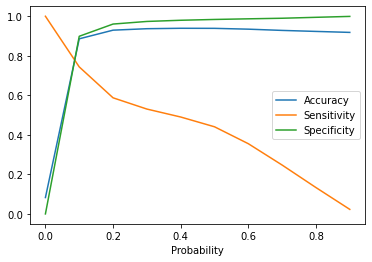

In [367]:
# Let"s plot accuracy sensitivity and specificity for various probabilities.
cutoff_matrix_dt.plot.line(x="Probability", y=["Accuracy","Sensitivity","Specificity"])
plt.show()

In [368]:
## 0.10 is optimal value
y_pred_final["Predicted"] = y_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.1 else 0)
y_pred_final.head()

,I,Churn,Churn_Prob,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,65002,1.0,0.645647,1,1,1,1,1,1,1,1,0,0,0
1,67088,0.0,0.160994,1,1,1,0,0,0,0,0,0,0,0
2,36410,0.0,0.013726,0,1,0,0,0,0,0,0,0,0,0
3,90870,0.0,0.034036,0,1,0,0,0,0,0,0,0,0,0
4,50581,0.0,0.033117,0,1,0,0,0,0,0,0,0,0,0


In [369]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_pred_final.Churn, y_pred_final.Predicted)
confusion
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [370]:
# calculating the sensitivity of our logistic regression model
print("Sensitivity:", round(TP / float(TP+FN), 2) * 100)

# calculating specificity
print("specificity:", round(TN / float(TN+FP), 2) * 100)

# Calculating false postive rate - predicting churn when customer does not have churned
print("False Postive Rate:", round(FP/ float(TN+FP), 2) * 100)

# Calculating positive predictive value 
print("positive predictive value:", round(TP / float(TP+FP), 2)* 100)

# Calculating Negative predictive value
print("Negative predictive value:", round(TN / float(TN+ FN), 2) * 100)

##Let's check the overall accuracy.
print("Accuracy:", round(metrics.accuracy_score(y_pred_final.Churn, y_pred_final.Predicted), 2) * 100)

## Calculating the precision
print( "Precision:" ,round(precision_score(y_pred_final.Churn, y_pred_final.Predicted), 2) * 100)

Sensitivity: 74.0
specificity: 90.0
False Postive Rate: 10.0
positive predictive value: 40.0
Negative predictive value: 97.0
Accuracy: 89.0
Precision: 40.0


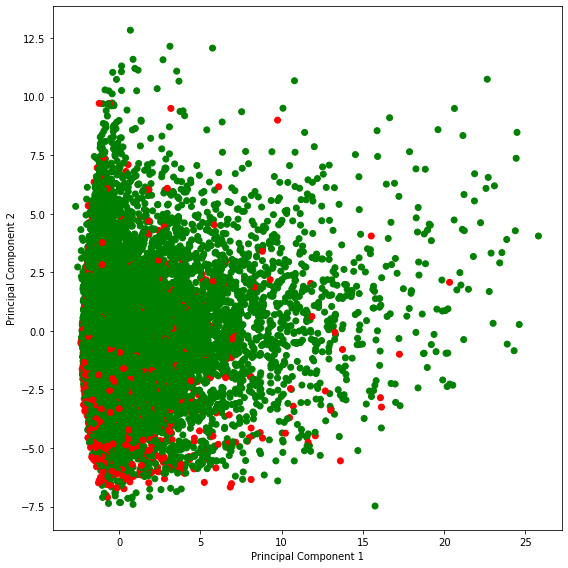

In [371]:
#Visulaization
%matplotlib inline
fig = plt.figure(figsize = (8,8))
plt.scatter(X_train_pca_1[:,0], X_train_pca_1[:,1], c = y_train.map({0:"green",1:"red"}))
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.tight_layout()
plt.show()

## PCA - Evaluation

In [372]:
X_test.head()

,arpu_6,arpu_7,arpu_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,total_rech_6,total_rech_7,total_rech_8,roam_any_6,roam_any_7,roam_any_8,local_any_6,local_any_7,local_any_8,std_any_6,std_any_7,std_any_8,spl_any_6,spl_any_7,spl_any_8,data_used_6,data_used_7,data_used_8
7526,-0.112658,0.408566,0.941526,-0.199309,-0.263180,-0.282320,0.073937,0.140639,-0.090309,0.290440,-0.417375,0.503855,-0.403845,-0.389939,2.540639,-0.430501,-0.079642,2.366790,0.0,0.0,0.0,-0.404881,1.839008,-0.382212,-0.436786,-0.454731,-0.433164,-0.391559,-0.392480,1.577106,-0.314153,-0.308542,-0.281961,2.117745,-0.519200,-0.124078,0.461783,-0.538742,-0.462995,-0.479220,0.198490,0.188422,0.275354,0.407931,0.407057,0.472673,0.567599,0.596857,0.629726,-0.340126,-0.407402,1.297075
74907,-0.888281,-0.863826,-1.226929,-0.899132,-0.882065,-0.823024,-0.850532,-0.857026,-0.826573,1.427562,-0.867973,-0.801509,0.904913,0.884993,-0.387767,1.045724,1.033511,-0.404519,0.0,0.0,0.0,-0.404881,-0.411920,-0.382212,-0.436786,-0.454731,-0.433164,1.554422,1.498772,-0.377061,-0.314153,-0.308542,-0.281961,-1.070643,-0.568436,-0.505809,-0.875328,-0.538742,-0.462995,-0.479220,-5.038046,0.188422,-3.631692,-2.451397,-2.456659,-2.115628,0.567599,0.596857,-1.587992,-0.419089,0.902371,-0.554494
99617,-0.223551,-0.749002,-1.200464,-0.180417,-0.892235,-0.823024,-0.103612,-0.829589,-0.826573,-0.644934,0.519869,-0.801509,-0.403845,-0.401582,-0.387767,-0.199852,-0.425760,-0.404519,0.0,0.0,0.0,1.915040,1.839008,-0.382212,-0.436786,-0.454731,-0.433164,-0.391559,-0.392480,-0.377061,-0.314153,-0.308542,-0.281961,0.072916,-0.518195,-0.523986,-0.875328,1.856175,2.159851,2.086723,0.198490,0.188422,0.275354,0.407931,0.407057,-2.115628,-1.761808,-1.675442,-1.587992,0.195803,0.275154,-0.566102
83565,-1.057697,-0.276556,-0.384443,-0.521320,-0.630275,-0.477168,-0.747909,-0.778314,-0.698012,-0.608253,-0.597614,-0.529558,-0.403845,-0.401582,1.028402,-0.430501,-0.387226,1.191370,0.0,0.0,0.0,-0.404881,4.089935,-0.382212,-0.436786,-0.454731,-0.433164,-0.391559,-0.392480,1.577106,-0.314153,-0.308542,-0.281961,-0.062849,-0.924143,0.095872,-0.325685,1.856175,-0.462995,-0.479220,0.198490,0.188422,0.275354,-2.451397,-2.456659,0.472673,-1.761808,-1.675442,0.629726,-0.581601,1.021002,1.420010
8695,0.020934,-0.135866,-0.384362,-0.842115,-0.840631,-0.709472,-0.492534,-0.382120,-0.454064,0.510528,-0.282195,-0.212282,1.733704,2.243425,0.954153,1.490742,2.574874,1.107020,0.0,0.0,0.0,-0.404881,-0.411920,-0.382212,0.408256,-0.454731,-0.433164,1.554422,3.390025,1.577106,1.783866,-0.308542,-0.281961,-0.952632,1.927541,0.496689,-0.374131,-0.538742,-0.462995,-0.479220,0.198490,0.188422,0.275354,0.407931,0.407057,0.472673,0.567599,-1.675442,0.629726,2.171938,2.493679,1.633211


In [373]:
#Transforming the test dataset
X_test_pca = pca_1.transform(X_test)
X_test_pca.shape

(9001, 15)

In [374]:
#Checking the y_test dataset head
y_test.head()

7526     0.0
74907    1.0
99617    0.0
83565    0.0
8695     0.0
Name: Churn, dtype: float64

In [375]:
# Making prediction on the test data
pred_prob_test = model.predict_proba(X_test_pca)[:,1]
"{:2.2}".format(metrics.roc_auc_score(y_test, pred_prob_test))

'0.89'

In [376]:
# Predicted test probabilities
y_test_pred = logsk.predict_proba(X_test_pca)
# Converting y_test_pred to a dataframe which is an array
y_test_pred_df = pd.DataFrame(y_test_pred)
# Converting to column dataframe
y_test_pred_df = y_test_pred_df.iloc[:,[1]]
# Let's see the head
y_test_pred_df.head()

,1
0,0.000819
1,0.703532
2,0.194355
3,0.003209
4,0.024883


In [377]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)
y_test_df.head()
# Putting "I" to index
y_test_df["I"] = y_test_df.index
# Removing index for both dataframes to append them side by side 
y_test_pred_df.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)
# Appending y_test_df and y_test_pred_df
y_test_pred_final = pd.concat([y_test_df,y_test_pred_df], axis=1)
# Renaming the column 
y_test_pred_final= y_test_pred_final.rename(columns={ 1 : "Churn_Prob"})
# Rearranging the columns
y_test_pred_final = y_test_pred_final.reindex(["I", "Churn", "Churn_Prob"], axis=1)
# Let"s see the head of y_test_pred_final
y_test_pred_final.head()
# Creating new column "Predicted" with 1 if Converted_Prob > 0.5 else 0
y_test_pred_final["Predicted"] = y_test_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.10 else 0)
# Let"s see the head
y_test_pred_final.head()

,I,Churn,Churn_Prob,Predicted
0,7526,0.0,0.000819,0
1,74907,1.0,0.703532,1
2,99617,0.0,0.194355,1
3,83565,0.0,0.003209,0
4,8695,0.0,0.024883,0


In [378]:
## Let's check the overall accuracy.
round(metrics.accuracy_score(y_test_pred_final.Churn, y_test_pred_final.Predicted), 4) * 100

87.76

In [379]:
confusion2 = metrics.confusion_matrix(y_test_pred_final.Churn, y_test_pred_final.Predicted )
confusion2

array([[7393,  907],
       [ 195,  506]], dtype=int64)

In [380]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [381]:
# calculating the sensitivity of our logistic regression model
print("Sensitivity:", round(TP / float(TP+FN), 2) * 100)

# calculating the specificity
print("Specificity:", round(TN / float(TN+FP), 2) * 100)

# Calculating the false postive rate - predicting churn when customer does not have churned
print("False Postive Rate:", round(FP/ float(TN+FP), 2) * 100)

# Calculating the positive predictive value 
print("positive predictive value:", round(TP / float(TP+FP), 2)* 100)

# Calculating the Negative predictive value
print("Negative predictive value:", round(TN / float(TN+ FN), 2) * 100)

# Calculating the overall accuracy.
print("accuracy:", round(metrics.accuracy_score(y_pred_final.Churn, y_pred_final.Predicted), 2) * 100)

# calculating the recall of our logistic regression model
print("Recall: ", round(TP / float(TP+FN), 2) * 100)

#calculating the precision looks like
print("Precision:" , round(TP / float(TP+FP), 2) * 100)

## Calculating the precision
print( "Precision:" ,round(precision_score(y_test_pred_final.Churn, y_test_pred_final.Predicted), 2) * 100)

Sensitivity: 72.0
Specificity: 89.0
False Postive Rate: 11.0
positive predictive value: 36.0
Negative predictive value: 97.0
accuracy: 89.0
Recall:  72.0
Precision: 36.0
Precision: 36.0


## Logistic Regression with RFE and VIF

In [382]:
scaler = StandardScaler()

In [383]:
X_train, X_test, y_train_log, y_test_log = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=42)

In [384]:
## Scaling only features which are numeric
X_train[["arpu_6", "arpu_7", "arpu_8", "total_og_mou_6", "total_og_mou_7", "total_og_mou_8", "total_ic_mou_6", "total_ic_mou_7", "total_ic_mou_8", "last_day_rch_amt_6", "last_day_rch_amt_7", "last_day_rch_amt_8", "arpu_3g_6", "arpu_3g_7", "arpu_3g_8", "arpu_2g_6", "arpu_2g_7", "arpu_2g_8", "night_pck_user_6", "night_pck_user_7", "night_pck_user_8", "monthly_2g_6", "monthly_2g_7", "monthly_2g_8", "sachet_2g_6", "sachet_2g_7", "sachet_2g_8", "monthly_3g_6", "monthly_3g_7", "monthly_3g_8", "sachet_3g_6", "sachet_3g_7", "sachet_3g_8", "aon", "total_rech_6", "total_rech_7", "total_rech_8", "roam_any_6", "roam_any_7", "roam_any_8", "local_any_6", "local_any_7", "local_any_8", "std_any_6", "std_any_7", "std_any_8", "spl_any_6", "spl_any_7", "spl_any_8", "data_used_6", "data_used_7", "data_used_8"]] = scaler.fit_transform(X_train[["arpu_6", "arpu_7", "arpu_8", "total_og_mou_6", "total_og_mou_7", "total_og_mou_8", "total_ic_mou_6", "total_ic_mou_7", "total_ic_mou_8", "last_day_rch_amt_6", "last_day_rch_amt_7", "last_day_rch_amt_8", "arpu_3g_6", "arpu_3g_7", "arpu_3g_8", "arpu_2g_6", "arpu_2g_7", "arpu_2g_8", "night_pck_user_6", "night_pck_user_7", "night_pck_user_8", "monthly_2g_6", "monthly_2g_7", "monthly_2g_8", "sachet_2g_6", "sachet_2g_7", "sachet_2g_8", "monthly_3g_6", "monthly_3g_7", "monthly_3g_8", "sachet_3g_6", "sachet_3g_7", "sachet_3g_8", "aon", "total_rech_6", "total_rech_7", "total_rech_8", "roam_any_6", "roam_any_7", "roam_any_8", "local_any_6", "local_any_7", "local_any_8", "std_any_6", "std_any_7", "std_any_8", "spl_any_6", "spl_any_7", "spl_any_8", "data_used_6", "data_used_7", "data_used_8"]])
X_test[["arpu_6", "arpu_7", "arpu_8", "total_og_mou_6", "total_og_mou_7", "total_og_mou_8", "total_ic_mou_6", "total_ic_mou_7", "total_ic_mou_8", "last_day_rch_amt_6", "last_day_rch_amt_7", "last_day_rch_amt_8", "arpu_3g_6", "arpu_3g_7", "arpu_3g_8", "arpu_2g_6", "arpu_2g_7", "arpu_2g_8", "night_pck_user_6", "night_pck_user_7", "night_pck_user_8", "monthly_2g_6", "monthly_2g_7", "monthly_2g_8", "sachet_2g_6", "sachet_2g_7", "sachet_2g_8", "monthly_3g_6", "monthly_3g_7", "monthly_3g_8", "sachet_3g_6", "sachet_3g_7", "sachet_3g_8", "aon", "total_rech_6", "total_rech_7", "total_rech_8", "roam_any_6", "roam_any_7", "roam_any_8", "local_any_6", "local_any_7", "local_any_8", "std_any_6", "std_any_7", "std_any_8", "spl_any_6", "spl_any_7", "spl_any_8", "data_used_6", "data_used_7", "data_used_8"]] = scaler.transform(X_test[["arpu_6", "arpu_7", "arpu_8", "total_og_mou_6", "total_og_mou_7", "total_og_mou_8", "total_ic_mou_6", "total_ic_mou_7", "total_ic_mou_8", "last_day_rch_amt_6", "last_day_rch_amt_7", "last_day_rch_amt_8", "arpu_3g_6", "arpu_3g_7", "arpu_3g_8", "arpu_2g_6", "arpu_2g_7", "arpu_2g_8", "night_pck_user_6", "night_pck_user_7", "night_pck_user_8", "monthly_2g_6", "monthly_2g_7", "monthly_2g_8", "sachet_2g_6", "sachet_2g_7", "sachet_2g_8", "monthly_3g_6", "monthly_3g_7", "monthly_3g_8", "sachet_3g_6", "sachet_3g_7", "sachet_3g_8", "aon", "total_rech_6", "total_rech_7", "total_rech_8", "roam_any_6", "roam_any_7", "roam_any_8", "local_any_6", "local_any_7", "local_any_8", "std_any_6", "std_any_7", "std_any_8", "spl_any_6", "spl_any_7", "spl_any_8", "data_used_6", "data_used_7", "data_used_8"]])


In [385]:
logreg_1= LogisticRegression()

In [386]:
rfe = RFE(logreg_1,20)

rfe = rfe.fit(X_train, y_train)

In [387]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('arpu_6', True, 1),
 ('arpu_7', True, 1),
 ('arpu_8', True, 1),
 ('total_og_mou_6', False, 20),
 ('total_og_mou_7', False, 19),
 ('total_og_mou_8', True, 1),
 ('total_ic_mou_6', True, 1),
 ('total_ic_mou_7', True, 1),
 ('total_ic_mou_8', True, 1),
 ('last_day_rch_amt_6', False, 21),
 ('last_day_rch_amt_7', False, 29),
 ('last_day_rch_amt_8', True, 1),
 ('arpu_3g_6', False, 8),
 ('arpu_3g_7', False, 26),
 ('arpu_3g_8', True, 1),
 ('arpu_2g_6', False, 9),
 ('arpu_2g_7', False, 18),
 ('arpu_2g_8', False, 3),
 ('night_pck_user_6', False, 31),
 ('night_pck_user_7', False, 32),
 ('night_pck_user_8', False, 33),
 ('monthly_2g_6', False, 6),
 ('monthly_2g_7', False, 13),
 ('monthly_2g_8', True, 1),
 ('sachet_2g_6', True, 1),
 ('sachet_2g_7', False, 17),
 ('sachet_2g_8', True, 1),
 ('monthly_3g_6', False, 30),
 ('monthly_3g_7', False, 15),
 ('monthly_3g_8', True, 1),
 ('sachet_3g_6', False, 24),
 ('sachet_3g_7', False, 2),
 ('sachet_3g_8', True, 1),
 ('aon', True, 1),
 ('total_rech_6', False,

In [388]:
col = X_train.columns[rfe.support_]

print(col)

Index(['arpu_6', 'arpu_7', 'arpu_8', 'total_og_mou_8', 'total_ic_mou_6',
       'total_ic_mou_7', 'total_ic_mou_8', 'last_day_rch_amt_8', 'arpu_3g_8',
       'monthly_2g_8', 'sachet_2g_6', 'sachet_2g_8', 'monthly_3g_8',
       'sachet_3g_8', 'aon', 'roam_any_7', 'roam_any_8', 'local_any_8',
       'std_any_8', 'data_used_8'],
      dtype='object')


### Assessing with  stats model

In [389]:
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                21000
Model:                            GLM   Df Residuals:                    20979
Model Family:                Binomial   Df Model:                           20
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3543.4
Date:                Sun, 04 Sep 2022   Deviance:                       7086.8
Time:                        19:15:00   Pearson chi2:                 8.44e+04
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -3.7894      0.062    -61.347      0.000      -3.911      -3.668
arpu_6                 0.1909      0.037      5.220      0.000       0.119       0.263
arpu_7                 0.3460      0.045      7.760      0.000       0.259       0.433
arpu_8                -0.2681      0.064     -4.169      0.000      -0.394      -0.142
total_og_mou_8        -0.2251      0.060     -3.782      0.000      -0.342      -0.108
total_ic_mou_6         0.1360      0.059      2.299      0.022       0.020       0.252
total_ic_mou_7         0.3459      0.075      4.605      0.000       0.199       0.493
total_ic_mou_8        -1.3193      0.111    -11.862      0.000      -1.537      -1.101
last_day_rch_amt_8    -0.3686      0.050     -7.394      0.000      -0.466      -0.271
arpu_3g_8              0.1524      0.108      1.405      0.160      -0.060       0.365
monthly_2g_8          -0.4573      0.073     -6.276      0.000      -0.600      -0.314
sachet_2g_6            0.1472      0.037      3.954      0.000       0.074       0.220
sachet_2g_8           -0.6849      0.075     -9.080      0.000      -0.833      -0.537
monthly_3g_8          -0.3898      0.097     -4.013      0.000      -0.580      -0.199
sachet_3g_8           -0.1421      0.052     -2.749      0.006      -0.243      -0.041
aon                   -0.2470      0.041     -6.030      0.000      -0.327      -0.167
roam_any_7            -0.3151      0.036     -8.787      0.000      -0.385      -0.245
roam_any_8             0.5152      0.032     16.210      0.000       0.453       0.577
local_any_8           -0.4981      0.029    -17.423      0.000      -0.554      -0.442
std_any_8             -0.2507      0.040     -6.258      0.000      -0.329      -0.172
data_used_8           -0.3923      0.093     -4.203      0.000      -0.575      -0.209
======================================================================================
"""

In [390]:
# Check for the VIF values of the feature variables. 

In [391]:
vif = pd.DataFrame()
vif["Features"] = X_train[col].columns
vif["VIF"] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif["VIF"] = round(vif["VIF"], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
8,arpu_3g_8,5.33
5,total_ic_mou_7,4.96
12,monthly_3g_8,4.02
2,arpu_8,3.84
6,total_ic_mou_8,3.75
4,total_ic_mou_6,3.27
19,data_used_8,2.88
1,arpu_7,2.55
3,total_og_mou_8,2.41
0,arpu_6,1.88


In [392]:
y_train_pred = res.predict(X_train_sm).values.reshape(-1)
y_train_pred

array([0.71226749, 0.09846146, 0.00752514, ..., 0.14707434, 0.02139364,
       0.00155166])

In [393]:
y_train_pred_final = pd.DataFrame({"Converted":y_train.values, "Converted_prob":y_train_pred})

y_train_pred_final["Converted_prob"] = y_train_pred

y_train_pred_final["predicted"] = y_train_pred_final.Converted_prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Converted,Converted_prob,predicted
0,1.0,0.712267,1
1,0.0,0.098461,0
2,0.0,0.007525,0
3,0.0,0.053053,0
4,0.0,0.011080,0


In [394]:
confusion_met = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.predicted )
print(confusion_met)

[[18925   335]
 [  908   832]]


In [395]:
number = [float(x)/10 for x in range(10)]
for i in number:
    y_train_pred_final[i]= y_train_pred_final.Converted_prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Converted,Converted_prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,1.0,0.712267,1,1,1,1,1,1,1,1,1,0,0
1,0.0,0.098461,0,1,0,0,0,0,0,0,0,0,0
2,0.0,0.007525,0,1,0,0,0,0,0,0,0,0,0
3,0.0,0.053053,0,1,0,0,0,0,0,0,0,0,0
4,0.0,0.011080,0,1,0,0,0,0,0,0,0,0,0


In [396]:
cutoff_data = pd.DataFrame( columns = ["prob","accuracy","sensi","speci"])

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

numb = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in numb:
    cm_2 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final[i] )
    total_2=sum(sum(cm_2))
    accuracy = (cm_2[0,0]+cm_2[1,1])/total_2
    
    speci = cm_2[0,0]/(cm_2[0,0]+cm_2[0,1])
    sensi = cm_2[1,1]/(cm_2[1,0]+cm_2[1,1])
    cutoff_data.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_data)

     prob  accuracy     sensi     speci
0.0   0.0  0.082857  1.000000  0.000000
0.1   0.1  0.887619  0.798276  0.895691
0.2   0.2  0.931524  0.677011  0.954517
0.3   0.3  0.938286  0.588506  0.969886
0.4   0.4  0.940238  0.525287  0.977726
0.5   0.5  0.940810  0.478161  0.982606
0.6   0.6  0.938667  0.406322  0.986760
0.7   0.7  0.932143  0.283333  0.990758
0.8   0.8  0.923810  0.125862  0.995898
0.9   0.9  0.919238  0.036782  0.998962


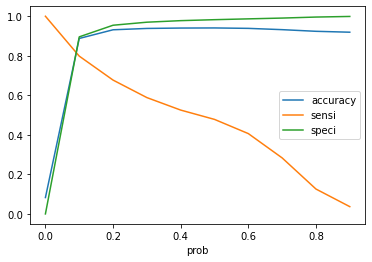

In [397]:
cutoff_data.plot.line(x="prob", y=["accuracy","sensi","speci"])
plt.show()

#### Looking at the graph we can see that both specifitivity and sensitivity are high when the cut off is 0.1, hence we will change it accordingly

In [398]:
y_train_pred_final['final_predicted'] = y_train_pred_final.Converted_prob.map( lambda x: 1 if x > 0.1 else 0)

y_train_pred_final.head()

,Converted,Converted_prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,1.0,0.712267,1,1,1,1,1,1,1,1,1,0,0,1
1,0.0,0.098461,0,1,0,0,0,0,0,0,0,0,0,0
2,0.0,0.007525,0,1,0,0,0,0,0,0,0,0,0,0
3,0.0,0.053053,0,1,0,0,0,0,0,0,0,0,0,0
4,0.0,0.011080,0,1,0,0,0,0,0,0,0,0,0,0


In [399]:
confusion2 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.final_predicted )
confusion2

array([[17251,  2009],
       [  351,  1389]], dtype=int64)

In [400]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [401]:
#Sensititivity of the model calculation
print("Sensitivity:",(round(TP/float(TP+FP),2)*100))

#Specificity of the model calculation
print("Specificity:",(round(TN / float(TN+FP),2)*100))

#Precision of the model calculation
print("Precision:",(round(TP / float(TP+FN),2)*100))

Sensitivity: 41.0
Specificity: 90.0
Precision: 80.0


## Decision Tree

In [402]:
dt_1 = DecisionTreeClassifier(max_depth=5)
dt_1.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=5)

In [403]:
# Making predictions
y_pred_def = dt_1.predict(X_test)

# Printing classification report
print(classification_report(y_test, y_pred_def))

              precision    recall  f1-score   support

         0.0       0.96      0.99      0.97      8300
         1.0       0.74      0.46      0.57       701

    accuracy                           0.95      9001
   macro avg       0.85      0.72      0.77      9001
weighted avg       0.94      0.95      0.94      9001



In [404]:
# Printing confusion matrix and accuracy
print(confusion_matrix(y_test,y_pred_def))
print(accuracy_score(y_test,y_pred_def))

[[8184  116]
 [ 379  322]]
0.9450061104321742


In [405]:
#Using gridsearch cv
# specify number of folds for k-fold CV
n_folds = 4

# parameters to build the model on
parameters = {'max_depth': range(1, 40)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",return_train_score=True)
tree.fit(X_train, y_train)

GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=100),
             param_grid={'max_depth': range(1, 40)}, return_train_score=True,
             scoring='accuracy')

In [406]:
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,0.037185,0.003415,0.003142,0.001103,1,{'max_depth': 1},0.933905,0.933143,0.927048,0.932762,0.931714,0.002726,8,0.931048,0.931365,0.933333,0.931429,0.931794,0.000901
1,0.060448,0.000995,0.002483,0.000509,2,{'max_depth': 2},0.945524,0.941524,0.940190,0.941714,0.942238,0.001986,3,0.941778,0.942921,0.943429,0.943111,0.942810,0.000623
2,0.085719,0.000721,0.002625,0.000404,3,{'max_depth': 3},0.946286,0.942286,0.941524,0.941714,0.942952,0.001945,2,0.943683,0.944635,0.944825,0.943429,0.944143,0.000598
3,0.111071,0.001146,0.002994,0.000002,4,{'max_depth': 4},0.946095,0.942857,0.941905,0.942667,0.943381,0.001607,1,0.943937,0.944952,0.945143,0.945016,0.944762,0.000481
4,0.137089,0.000937,0.002751,0.000436,5,{'max_depth': 5},0.944190,0.941524,0.939619,0.937143,0.940619,0.002582,4,0.944317,0.945968,0.947111,0.946730,0.946032,0.001072


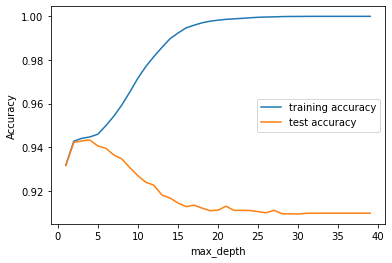

In [407]:
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

#### You can see that as we increase the value of max_depth, both training and test score increase till about max-depth = 3, after which the test score gradually reduces. Note that the scores are average accuracies across the 4-folds. 

#### Now we will tune Minimum samples leaf


In [408]:
# specify number of folds for k-fold CV
n_folds = 4

# parameters to build the model on
parameters = {'min_samples_leaf': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 50)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",return_train_score=True)
tree.fit(X_train, y_train)

GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=50),
             param_grid={'min_samples_leaf': range(5, 200, 20)},
             return_train_score=True, scoring='accuracy')

In [409]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,0.364096,0.013366,0.003227,4.236925e-04,5,{'min_samples_leaf': 5},0.925905,0.923429,0.921524,0.919810,0.922667,0.002266,10,0.968190,0.968762,0.970984,0.969524,0.969365,0.001048
1,0.298741,0.010474,0.002487,4.983140e-04,25,{'min_samples_leaf': 25},0.943810,0.938857,0.940571,0.937143,0.940095,0.002463,6,0.950222,0.950095,0.950540,0.949841,0.950175,0.000251
2,0.269279,0.014479,0.002385,4.237692e-04,45,{'min_samples_leaf': 45},0.942857,0.939048,0.937905,0.935619,0.938857,0.002619,9,0.945651,0.947048,0.947810,0.945587,0.946524,0.000944
3,0.248323,0.011171,0.002738,4.336786e-04,65,{'min_samples_leaf': 65},0.942857,0.940762,0.937714,0.934667,0.939000,0.003099,8,0.943746,0.945587,0.945841,0.945143,0.945079,0.000809
4,0.242101,0.009756,0.002992,1.685874e-07,85,{'min_samples_leaf': 85},0.942476,0.939619,0.937333,0.938667,0.939524,0.001888,7,0.943556,0.943873,0.945333,0.944317,0.944270,0.000671


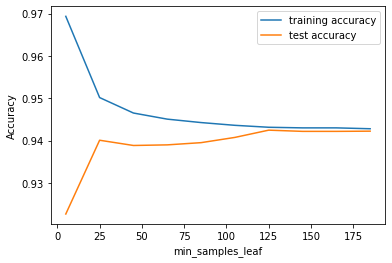

In [410]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

#### We can see that at values > 125, the test and train score starts to converge and hence the model starts becoming more stable

#### Now we will tune min_samples_split

In [411]:
# specify number of folds for k-fold CV
n_folds = 4

# parameters to build the model on
parameters = {'min_samples_split': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",return_train_score=True)
tree.fit(X_train, y_train)

GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=100),
             param_grid={'min_samples_split': range(5, 200, 20)},
             return_train_score=True, scoring='accuracy')

In [412]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,0.384186,0.004957,0.003125,0.000523,5,{'min_samples_split': 5},0.914857,0.915429,0.910476,0.907619,0.912095,0.003217,10,0.991746,0.992063,0.992508,0.993016,0.992333,0.000478
1,0.380920,0.006069,0.002979,0.000006,25,{'min_samples_split': 25},0.924571,0.923238,0.925524,0.921714,0.923762,0.001434,9,0.967302,0.968508,0.967365,0.966349,0.967381,0.000765
2,0.376534,0.006336,0.002736,0.000433,45,{'min_samples_split': 45},0.931810,0.924000,0.937143,0.926476,0.929857,0.005065,8,0.960381,0.960825,0.958857,0.960000,0.960016,0.000730
3,0.370510,0.007513,0.002486,0.000497,65,{'min_samples_split': 65},0.938286,0.930286,0.939048,0.932381,0.935000,0.003750,7,0.955873,0.956508,0.955175,0.955619,0.955794,0.000482
4,0.370297,0.004463,0.002728,0.000427,85,{'min_samples_split': 85},0.938476,0.934286,0.938667,0.933333,0.936190,0.002406,6,0.952698,0.952254,0.951683,0.951556,0.952048,0.000459


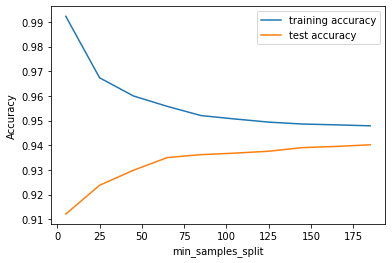

In [413]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

#### We notice that with values > 150, the train and test accuracy start to converge hence making the model more stable and less complex

### Now we will be running the model with grid search to find the optimal hyper parameters

In [414]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = 4

# Instantiate the grid search model
dtree = DecisionTreeClassifier()
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, verbose = 1)

# Fit the grid search to the data
grid_search.fit(X_train,y_train)

Fitting 4 folds for each of 16 candidates, totalling 64 fits


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': range(5, 15, 5),
                         'min_samples_leaf': range(50, 150, 50),
                         'min_samples_split': range(50, 150, 50)},
             verbose=1)

In [415]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,0.173380,0.004029,0.002733,0.000427,entropy,5,50,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.944190,0.940952,0.940000,0.940762,0.941476,0.001607,1
1,0.171283,0.001305,0.002747,0.000436,entropy,5,50,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.944190,0.940952,0.940000,0.940762,0.941476,0.001607,1
2,0.168485,0.000832,0.002720,0.000425,entropy,5,100,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.942095,0.938667,0.937333,0.940190,0.939571,0.001773,9
3,0.170319,0.003654,0.002488,0.000492,entropy,5,100,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.942095,0.938667,0.937333,0.940190,0.939571,0.001773,9
4,0.281443,0.005161,0.002740,0.000429,entropy,10,50,50,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.944000,0.934857,0.938476,0.938095,0.938857,0.003285,13
5,0.280869,0.005934,0.002493,0.000494,entropy,10,50,100,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.944000,0.934857,0.938476,0.938095,0.938857,0.003285,13
6,0.262885,0.004878,0.002633,0.000409,entropy,10,100,50,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.942095,0.938667,0.937333,0.939810,0.939476,0.001748,11
7,0.261728,0.005652,0.002656,0.000413,entropy,10,100,100,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.942095,0.938667,0.937333,0.939810,0.939476,0.001748,11
8,0.123382,0.000978,0.002142,0.000251,gini,5,50,50,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.944190,0.940952,0.938857,0.938667,0.940667,0.002223,3
9,0.122427,0.000829,0.001991,0.000005,gini,5,50,100,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.944190,0.940952,0.938857,0.938667,0.940667,0.002223,3


In [416]:
# printing the optimal accuracy score and hyperparameters
print("best accuracy", grid_search.best_score_)
print(grid_search.best_estimator_)

best accuracy 0.9414761904761905
DecisionTreeClassifier(criterion='entropy', max_depth=5, min_samples_leaf=50,
                       min_samples_split=50)


####  Running the model with the best parameters obtained from the grid search

In [417]:
# model with optimal hyperparameters
clf_gini = DecisionTreeClassifier(criterion = "gini", 
                                  random_state = 100,
                                  max_depth=5, 
                                  min_samples_leaf=50,
                                  min_samples_split=50)
clf_gini.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=5, min_samples_leaf=50, min_samples_split=50,
                       random_state=100)

In [418]:
from sklearn.metrics import classification_report,confusion_matrix
y_pred = clf_gini.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.96      0.99      0.97      8300
         1.0       0.74      0.45      0.56       701

    accuracy                           0.95      9001
   macro avg       0.85      0.72      0.77      9001
weighted avg       0.94      0.95      0.94      9001



## ADA boosting

In [419]:
# base estimator: a weak learner with max_depth=2
tree_shallow = DecisionTreeClassifier(max_depth=2, random_state = 100)

In [420]:
# # fit the shallow decision tree 
tree_shallow.fit(X_train, y_train)
y_train_pred_ada = tree_shallow.predict(X_train)
metrics.accuracy_score(y_train, y_train_pred_ada)

0.9427619047619048

In [421]:
# adaboost with the tree as base estimator

estimators = list(range(1, 50, 3))

abc_scores = []
for n_est in estimators:
    ABClassifier = AdaBoostClassifier(
    base_estimator=tree_shallow, 
    n_estimators = n_est)
    
    ABClassifier.fit(X_train, y_train)
    y_pred = ABClassifier.predict(X_test)
    score = metrics.accuracy_score(y_test, y_pred)
    abc_scores.append(score)

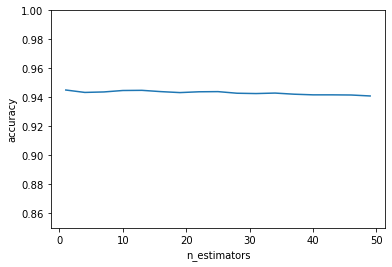

In [422]:
# plot test scores and n_estimators
# plot
plt.plot(estimators, abc_scores)
plt.xlabel('n_estimators')
plt.ylabel('accuracy')
plt.ylim([0.85, 1])
plt.show()

#### ## Based on above grah it looks like 15 trees are giving maximum accuracy. Let's have a random forest model

In [423]:
ABClassifier = AdaBoostClassifier(
    base_estimator=tree_shallow, 
    n_estimators = 15)
    
ABClassifier.fit(X_train, y_train)
y_pred = ABClassifier.predict(X_test)
score = metrics.accuracy_score(y_test, y_pred)

# Printing confusion matrix
print(confusion_matrix(y_test,y_pred))

[[8131  169]
 [ 335  366]]


In [424]:
# Importing classification report 
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         0.0       0.96      0.98      0.97      8300
         1.0       0.68      0.52      0.59       701

    accuracy                           0.94      9001
   macro avg       0.82      0.75      0.78      9001
weighted avg       0.94      0.94      0.94      9001



## Random Forest

In [425]:
# Running the random forest with 13 trees
random_for = RandomForestClassifier(n_estimators=15)
random_for.fit(X_train,y_train)

RandomForestClassifier(n_estimators=15)

In [426]:
# Making predictions
prediction = random_for.predict(X_test)

# Importing classification report 
print(classification_report(y_test,prediction))

              precision    recall  f1-score   support

         0.0       0.96      0.98      0.97      8300
         1.0       0.72      0.48      0.58       701

    accuracy                           0.95      9001
   macro avg       0.84      0.73      0.77      9001
weighted avg       0.94      0.95      0.94      9001



#### Grid search for random forest analysis

In [427]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': [4,8,12,16,20],
    'min_samples_leaf': range(10, 20, 30),
    'min_samples_split': range(10, 30, 50),
    'n_estimators': [5,10,15,20], 
    'max_features': [5, 10, 15]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1,verbose = 1)

In [428]:
# Fit the grid search to the data
grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 60 candidates, totalling 180 fits


GridSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': [4, 8, 12, 16, 20],
                         'max_features': [5, 10, 15],
                         'min_samples_leaf': range(10, 20, 30),
                         'min_samples_split': range(10, 30, 50),
                         'n_estimators': [5, 10, 15, 20]},
             verbose=1)

In [429]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.9443809523809522 using {'max_depth': 12, 'max_features': 15, 'min_samples_leaf': 10, 'min_samples_split': 10, 'n_estimators': 20}


#### Fitting the best model

In [430]:
# model with the best hyperparameters
rfc_fin = RandomForestClassifier(bootstrap=True,
                             max_depth=16,
                             min_samples_leaf=10, 
                             min_samples_split=10,
                             max_features=5,
                             n_estimators=15)

In [431]:
# fit
rfc_fin.fit(X_train,y_train)

RandomForestClassifier(max_depth=16, max_features=5, min_samples_leaf=10,
                       min_samples_split=10, n_estimators=15)

In [432]:
# predict
prediction = rfc_fin.predict(X_test)

In [433]:
print(classification_report(y_test,prediction))

              precision    recall  f1-score   support

         0.0       0.96      0.99      0.97      8300
         1.0       0.75      0.48      0.59       701

    accuracy                           0.95      9001
   macro avg       0.85      0.73      0.78      9001
weighted avg       0.94      0.95      0.94      9001



## Conclusion

### The following models were used in this project

    - Princple component Analysis and Regression
    - Logistic Regression with RFE and VIF
    - Decision Tree
    - ADA Boosting with Decision Tree
    - Random Forest

## Strategy moving forward

In [434]:
features_value=[]
features_value.append('Incoming for July , Churn Customers Average Values:{0}, Non Churn Customers Average Values:{1}'.format(round(data_model[data_model.Churn==1].total_ic_mou_7.mean(),2), round(data_model[data_model.Churn==0].total_ic_mou_7.mean(),2)))
features_value.append('Incoming for August, Churn Customers Average Values:{0}, Non Churn Customers Average Values:{1}'.format(round(data_model[data_model.Churn==1].total_ic_mou_8.mean(),2), round(data_model[data_model.Churn==0].total_ic_mou_8.mean(),2)))
features_value.append('2G Sachet for August, Churn Customers Average Values:{0}, Non Churn Customers Average Values:{1}'.format(round(data_model[data_model.Churn==1].sachet_2g_8.mean(),2), round(data_model[data_model.Churn==0].sachet_2g_8.mean(),2)))
features_value.append('2G Monthly for August, Churn Customers Average Values:{0}, Non Churn Customers Average Values:{1}'.format(round(data_model[data_model.Churn==1].monthly_2g_8.mean(),2), round(data_model[data_model.Churn==0].monthly_2g_8.mean(),2)))
features_value.append('Roaming Total Usage, Churn Customers Average Values:{0}, Non Churn Customers Average Values:{1}'.format(round(data_model[data_model.Churn==1][['roam_ic_mou_8', 'roam_og_mou_8']].sum(axis=1).mean(),2), round(data_model[data_model.Churn==0][['roam_ic_mou_8', 'roam_og_mou_8']].sum(axis=1).mean(),2)))

features_value

['Incoming for July , Churn Customers Average Values:180.94, Non Churn Customers Average Values:302.78',
 'Incoming for August, Churn Customers Average Values:63.44, Non Churn Customers Average Values:295.56',
 '2G Sachet for August, Churn Customers Average Values:0.27, Non Churn Customers Average Values:1.11',
 '2G Monthly for August, Churn Customers Average Values:0.02, Non Churn Customers Average Values:0.16',
 'Roaming Total Usage, Churn Customers Average Values:41.97, Non Churn Customers Average Values:19.26']

#### The following 5 factors affect the churn rate considerably -

    1) Total Incoming Minutes of usage in the July 
    2) Total Incoming Minutes of usage in the August
    3) 2G data pack
    4) Roaming
    5) Sachet 2g
    
Additionally, since churn is inversely correlated with these metrics, we must develop campaigns that would keep customers engaged online or through incoming calls. It's interesting to note that a lot of people are dependent on 2G and do not churn as a result. It gives us a fantastic opportunity to move these individuals from 2g to 3g, increasing the likelihood that they won't churn. Discounts on 3G packs may therefore be one of the most successful marketing campaigns.